# E-commerce site clients segmentation

# Content
- [Unpickling dataframes](#Unpickling-dataframes)
- [Feature correlation analysis](#Feature-correlation-analysis)
- [Feature transformation and standardization for outlier detection](#Feature-transformation-and-standardization-for-outlier-detection)
- [PCA for dimensionality reduction](#PCA-for-dimensionality-reduction)
- [K-means clusterization](#K-means-clusterization)
- [DBSCAN clusterization](#DBSCAN-clusterization)
- [T-SNE for dimensionality reduction](#T-SNE-for-dimensionality-reduction)
- [Segmentation maintenance analysis](#Segmentation-maintenance-analysis)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Use seaborn style defaults and set the default figure size
import seaborn as sns
sns.set(rc={'figure.figsize':(11, 6)})

## Unpickling dataframe

After we pickled the dataframe, we have to unpickle it.

In [2]:
# To unpickle the dataframe

new_df_for_segmentation_analysis = pd.read_pickle("./pickle_data_automatic_segmentation.pkl")

rfm_new_df_for_automatic_segmentation = pd.read_pickle("./pickle_data_RFM_segmentation.pkl")

df_subset_for_purchase_dates = pd.read_pickle("./pickle_dataset_time_analysis.pkl")

### Creation of a dataframe for Machine Learning based segmentation

We will perform the customers segmentation by using unsupervised Machine Learning algorithms. For this we will create a new data frame that will contain the variables that we will potentially use for this.

In [3]:
automatic_segmentation_df = new_df_for_segmentation_analysis.copy()

In [4]:
automatic_segmentation_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 94228 entries, 61236 to 112911
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   product_id                          94228 non-null  object 
 1   order_id                            94228 non-null  object 
 2   review_id                           94228 non-null  object 
 3   review_score_for_a_customer_order   94228 non-null  int64  
 4   zip_code_prefix                     94228 non-null  int64  
 5   customer_geolocation_latitude       94228 non-null  float64
 6   customer_geolocation_longitude      94228 non-null  float64
 7   customer_id                         94228 non-null  object 
 8   customer_unique_id                  94228 non-null  object 
 9   customer_city                       94228 non-null  object 
 10  customer_state                      94228 non-null  object 
 11  order_purchase_timestamp            

We will eliminate information containing some identifiers such as the product and order. We will eliminate the customer_zip_code_prefix, the customer city and state. 

We will also eliminate the variables number_of_orders_for_a_customer and payment_value_for_a_customer_order because we will merge the present dataframe with the one created for the RFM analysis and we will keep the Recency, Frequency and Monetary_value features.

In [5]:
automatic_segmentation_df.columns

Index(['product_id', 'order_id', 'review_id',
       'review_score_for_a_customer_order', 'zip_code_prefix',
       'customer_geolocation_latitude', 'customer_geolocation_longitude',
       'customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_purchase_timestamp', 'order_delivered_customer_date',
       'payment_type', 'payment_value_for_a_customer_order',
       'product_category_name_english', 'number_of_orders_for_a_customer',
       'number_of_items_for_a_customer', 'delay_days_purchase_delivery',
       'olist_office_customer_distance'],
      dtype='object')

In [6]:
automatic_segmentation_df = automatic_segmentation_df.drop(columns=['product_id',
                                                                    'order_id',
                                                                    'review_id',
                                                                    'zip_code_prefix', 
                                                                    'customer_geolocation_latitude', 
                                                                    'customer_geolocation_longitude',
                                                                    'customer_id', 
                                                                    'customer_city', 
                                                                    'customer_state',
                                                                    'order_purchase_timestamp', 
                                                                    'order_delivered_customer_date',
                                                                    'payment_type',
                                                                    'payment_value_for_a_customer_order',
                                                                    'product_category_name_english',
                                                                    'number_of_orders_for_a_customer'])

In [7]:
automatic_segmentation_new_df = automatic_segmentation_df.copy()

In [8]:
automatic_segmentation_new_df = pd.merge(automatic_segmentation_df, rfm_new_df_for_automatic_segmentation, on='customer_unique_id')

In [9]:
automatic_segmentation_new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121072 entries, 0 to 121071
Data columns (total 10 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   review_score_for_a_customer_order  121072 non-null  int64  
 1   customer_unique_id                 121072 non-null  object 
 2   number_of_items_for_a_customer     121072 non-null  int64  
 3   delay_days_purchase_delivery       121072 non-null  int64  
 4   olist_office_customer_distance     121072 non-null  float64
 5   Segment_name                       121072 non-null  object 
 6   Frequency                          121072 non-null  int64  
 7   Monetary_value                     121072 non-null  float64
 8   Recency                            121072 non-null  int64  
 9   RFM_Score                          121072 non-null  float64
dtypes: float64(3), int64(5), object(2)
memory usage: 10.2+ MB


## Feature correlation analysis

We will calculate the pairwise correlation between columns and return a correlation matrix. We used the corr() function with the Kendall correlation coefficient, which measures the monotonic relationship between two variables. It does not require the variables to be normally distributed. (See reference https://www.learnpythonwithrune.org/pandas-correlation-methods-explained-pearson-kendall-and-spearman/).

The correlation matrix allows us to identify correlations between pairs of variables as we will see next.

* Correlation Coefficient = +1: A perfect positive relationship. 

* Correlation Coefficient >= 0.8: A fairly strong positive relationship.

* Correlation Coefficient <= -0.8: A fairly strong negative relationship.

The idea is to eliminate those variables that have more than 0.75 correlation.

In [10]:
automatic_segmentation_new_df.columns

Index(['review_score_for_a_customer_order', 'customer_unique_id',
       'number_of_items_for_a_customer', 'delay_days_purchase_delivery',
       'olist_office_customer_distance', 'Segment_name', 'Frequency',
       'Monetary_value', 'Recency', 'RFM_Score'],
      dtype='object')

In [11]:
columns_for_correlation_matriz = ['review_score_for_a_customer_order',
                                    'number_of_items_for_a_customer', 
                                    'delay_days_purchase_delivery',
                                    'olist_office_customer_distance', 
                                    'Frequency',
                                    'Monetary_value', 
                                    'Recency']

In [12]:
df_for_correlation_matrix = automatic_segmentation_new_df.copy()

In [13]:
df_for_correlation_matrix = df_for_correlation_matrix[columns_for_correlation_matriz]
df_for_correlation_matrix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121072 entries, 0 to 121071
Data columns (total 7 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   review_score_for_a_customer_order  121072 non-null  int64  
 1   number_of_items_for_a_customer     121072 non-null  int64  
 2   delay_days_purchase_delivery       121072 non-null  int64  
 3   olist_office_customer_distance     121072 non-null  float64
 4   Frequency                          121072 non-null  int64  
 5   Monetary_value                     121072 non-null  float64
 6   Recency                            121072 non-null  int64  
dtypes: float64(2), int64(5)
memory usage: 7.4 MB


In [14]:
correlation_matrix = df_for_correlation_matrix.corr(method='kendall')

C:\Users\ASUS\anaconda3\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


<AxesSubplot:>

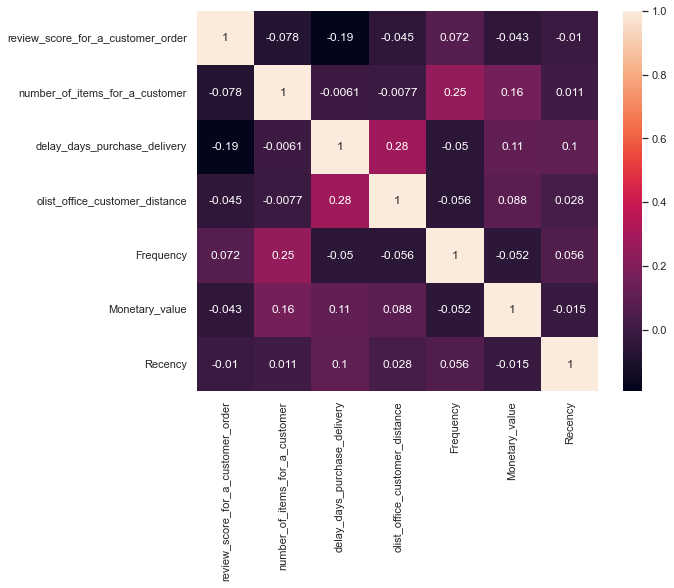

In [15]:
plt.figure(figsize=(9,7))
sns.heatmap(correlation_matrix, xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns, annot=True)

## Feature transformation and standardization for outlier detection 

### Log-transform for skewed distributions

We are going to apply a logaritmic transformation to the variables that are more asymmetrical from our data. Log transformation also de-emphasizes outliers and allows us to potentially obtain a bell-shaped distribution. The idea is that taking the log of the data can restore symmetry to the data.

See references: 

* https://www.sciencedirect.com/topics/computer-science/log-transformation#:~:text=Log%20transformation%20also%20de%2Demphasizes,restore%20symmetry%20to%20the%20data.&text=If%20the%20distance%20between%20each,the%20variable%20skews%20the%20distance
* https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

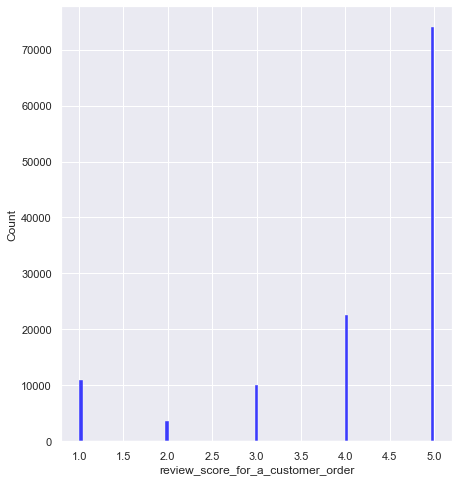

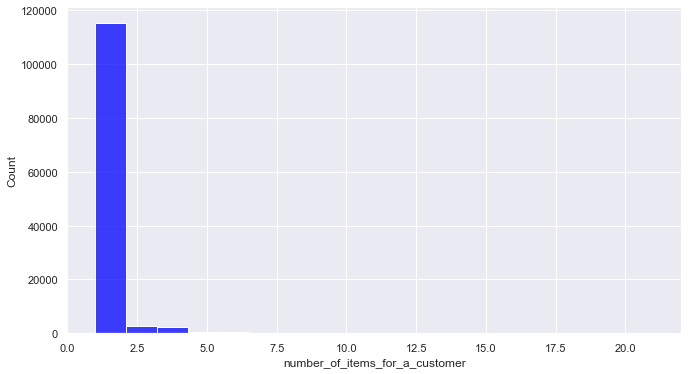

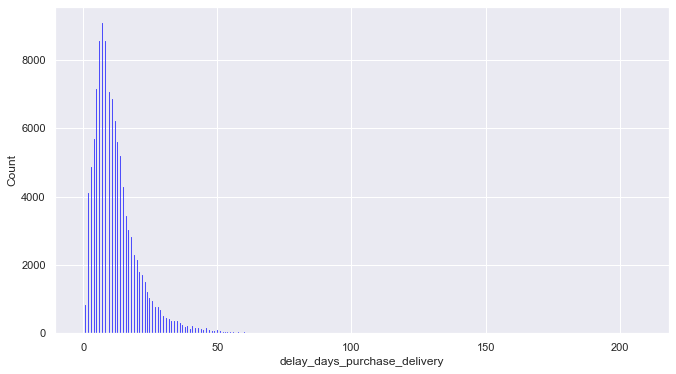

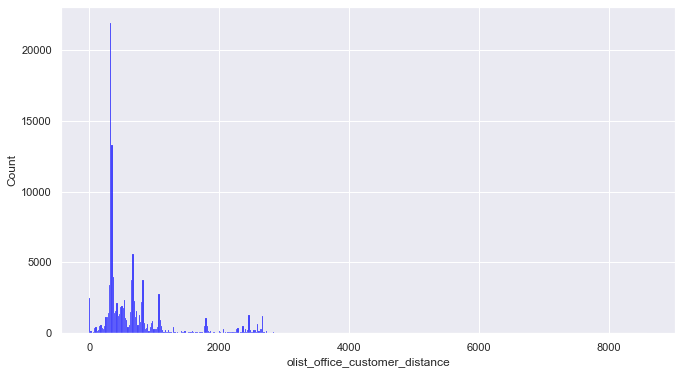

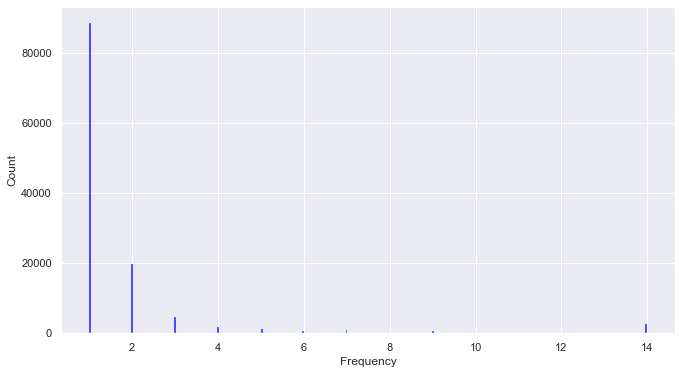

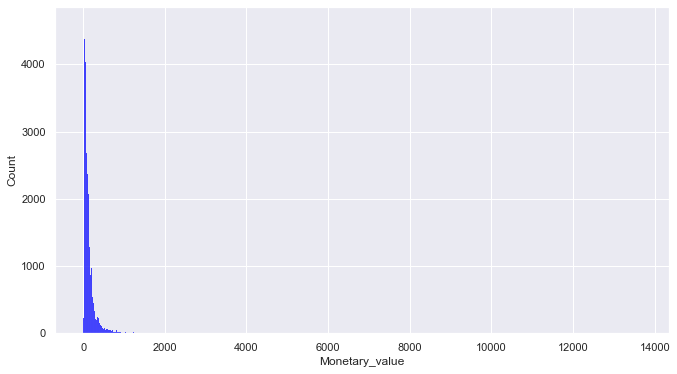

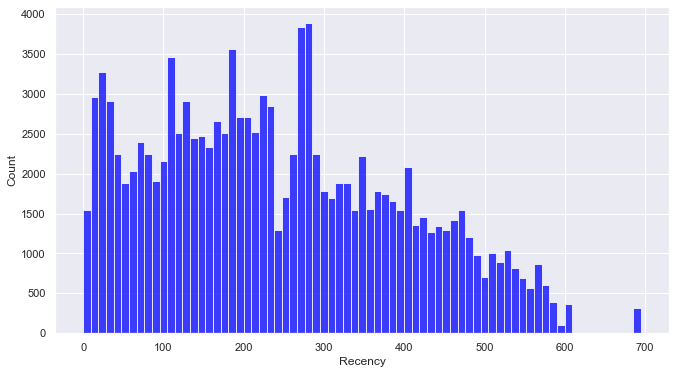

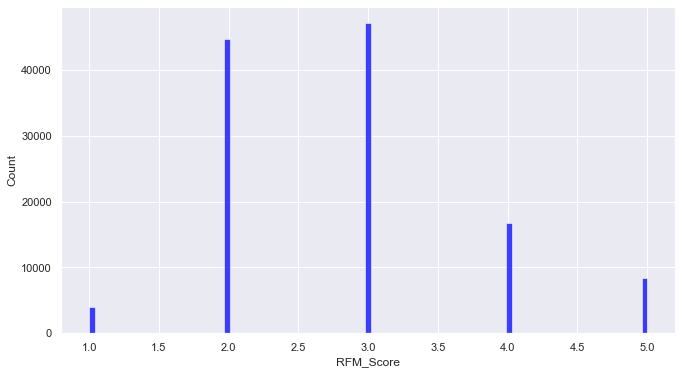

In [16]:
plt.subplots(figsize=(7, 8))

columns_histogram = automatic_segmentation_new_df.columns.tolist()
columns_histogram.remove('Segment_name')
columns_histogram.remove('customer_unique_id')
# columns_histogram.remove('RFM_Score')

for i in columns_histogram:
    sns.histplot(data = automatic_segmentation_new_df, x=i, color="blue")
    plt.show()

In [17]:
df_log_transformed = automatic_segmentation_new_df.copy()

In [18]:
columns_for_log_transformation = ['review_score_for_a_customer_order',
                                    'number_of_items_for_a_customer',
                                    'Frequency',
                                    'Monetary_value',
                                    'Recency',
                                    'delay_days_purchase_delivery',
                                    'olist_office_customer_distance']

In [19]:
for col in df_log_transformed.columns:
    if col in columns_for_log_transformation:
        df_log_transformed[col] = np.log10(df_log_transformed[col] + 0.1) 

In [20]:
# columns_histogram = df_log_transformed.columns.tolist()
# columns_histogram.remove('Segment_name')

# plt.subplots(figsize=(7, 8))
# for i in columns_histogram:
#     sns.histplot(data=df_log_transformed, x=i, color="blue")
#     plt.show()

In [21]:
df_log_transformed.describe()

,review_score_for_a_customer_order,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,Frequency,Monetary_value,Recency,RFM_Score
count,121072.000000,121072.000000,121072.000000,121072.000000,121072.000000,121072.000000,121072.000000,121072.000000
mean,0.600369,0.095796,0.991810,2.709783,0.160792,2.010776,2.252073,2.841293
std,0.196564,0.139554,0.298866,0.402842,0.238380,0.372021,0.412931,0.944458
min,0.041393,0.041393,-1.000000,-0.118249,0.041393,-1.000000,-1.000000,1.000000
25%,0.612784,0.041393,0.785330,2.530504,0.041393,1.764176,2.075912,2.000000
50%,0.707570,0.041393,1.004321,2.681452,0.041393,2.000434,2.354301,3.000000
75%,0.707570,0.041393,1.178977,2.908665,0.322219,2.233250,2.550351,3.000000
max,0.707570,1.324282,2.318272,3.934224,1.149219,4.135581,2.842047,5.000000


### Z-scores standardization

We are going to use Z-scores to detect outliers in our data, and to standardize it. See references: 

* https://www.mygreatlearning.com/blog/outlier-analysis-explained/
* https://www.codecademy.com/article/normalization
* https://jamesmccaffrey.wordpress.com/2020/05/27/should-you-normalize-and-encode-data-before-train-test-splitting-or-after-splitting/

In [22]:
df_for_z_scores = df_log_transformed.copy()

In [23]:
columns_for_z_scores = df_for_z_scores.columns.tolist()
columns_for_z_scores.remove('Segment_name')
columns_for_z_scores.remove('customer_unique_id')
columns_for_z_scores.remove('RFM_Score')

for col in df_for_z_scores.columns:
    if col in columns_for_z_scores:
        # standardize data
        df_for_z_scores[col] = (df_for_z_scores[col] - df_for_z_scores[col].mean()) / df_for_z_scores[col].std()

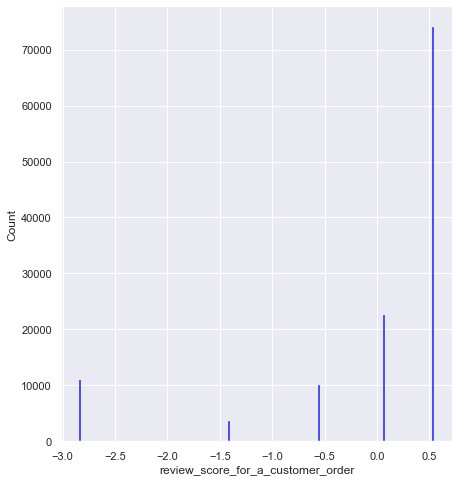

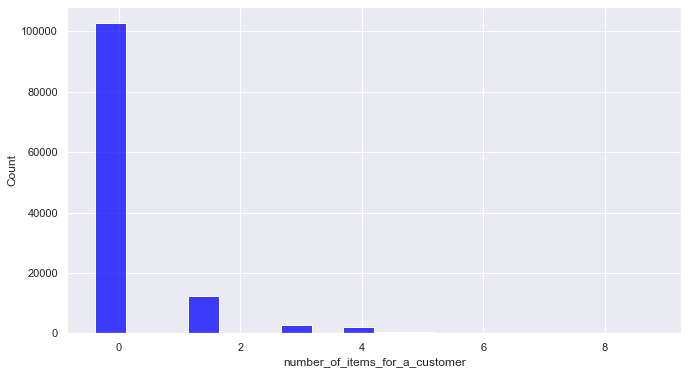

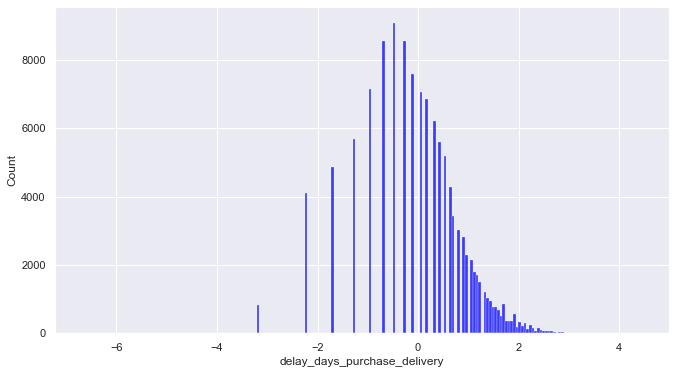

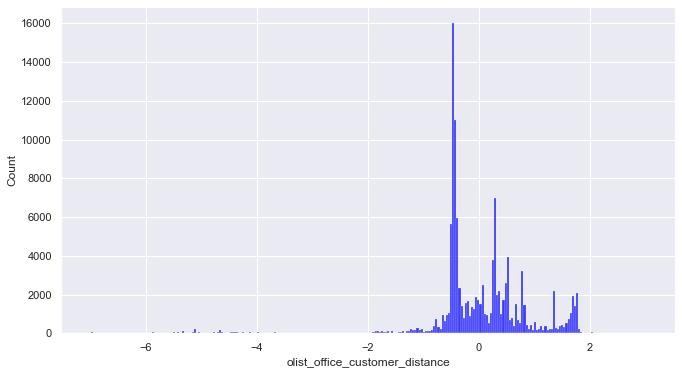

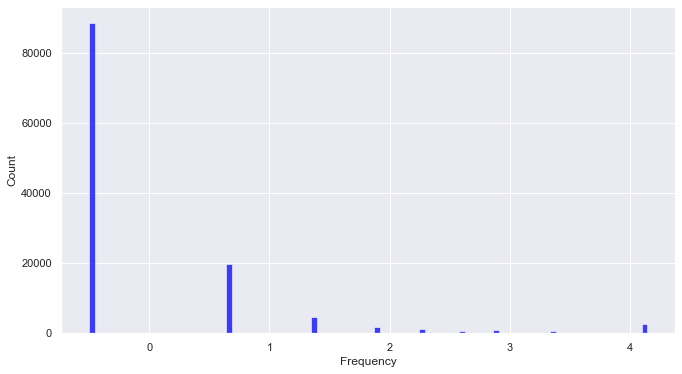

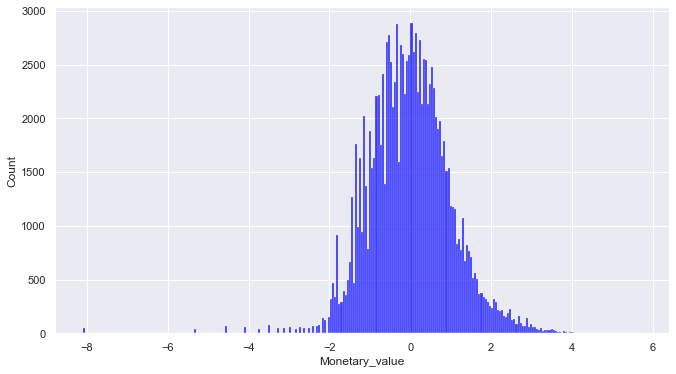

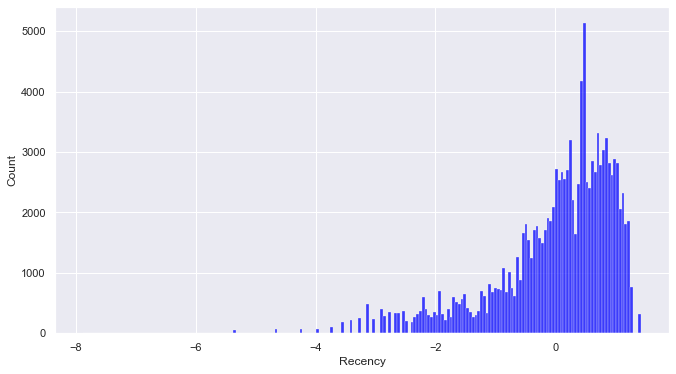

In [24]:
columns_histogram = df_for_z_scores.columns.tolist()
columns_histogram.remove('Segment_name')
columns_histogram.remove('customer_unique_id')
columns_histogram.remove('RFM_Score')

plt.subplots(figsize=(7, 8))
for i in columns_histogram:
    sns.histplot(data=df_for_z_scores, x=i, color="blue")
    plt.show()

In [25]:
df_standardized = df_for_z_scores.copy()

In [26]:
df_standardized_without_outliers = df_standardized.loc[(df_standardized['number_of_items_for_a_customer'] >= -3) & (df_standardized['number_of_items_for_a_customer'] <= 3)
                                                        & (df_standardized['Frequency'] >= -2) & (df_standardized['Frequency'] <= 2)
                                                        & (df_standardized['Monetary_value'] >= -3) & (df_standardized['Monetary_value'] <= 3)
                                                        & (df_standardized['Recency'] >= -3) & (df_standardized['Recency'] <= 3)
                                                        & (df_standardized['delay_days_purchase_delivery'] >= -2) & (df_standardized['delay_days_purchase_delivery'] <= 2)
                                                        & (df_standardized['olist_office_customer_distance'] >= -3) & (df_standardized['olist_office_customer_distance'] <= 3)]

In [28]:
df_standardized_without_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102333 entries, 3033 to 121071
Data columns (total 10 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   review_score_for_a_customer_order  102333 non-null  float64
 1   customer_unique_id                 102333 non-null  object 
 2   number_of_items_for_a_customer     102333 non-null  float64
 3   delay_days_purchase_delivery       102333 non-null  float64
 4   olist_office_customer_distance     102333 non-null  float64
 5   Segment_name                       102333 non-null  object 
 6   Frequency                          102333 non-null  float64
 7   Monetary_value                     102333 non-null  float64
 8   Recency                            102333 non-null  float64
 9   RFM_Score                          102333 non-null  float64
dtypes: float64(8), object(2)
memory usage: 8.6+ MB


In [29]:
# columns_histogram = df_standardized_without_outliers.columns.tolist()
# columns_histogram.remove('Segment_name')
# columns_histogram.remove('customer_unique_id')
# columns_histogram.remove('RFM_Score')

# plt.subplots(figsize=(7, 8))
# for i in columns_histogram:
#     sns.histplot(data=df_standardized_without_outliers, x=i, color="blue")
#     plt.show()

## PCA for dimensionality reduction

### PCA run

In [30]:
df_for_PCA = df_standardized_without_outliers.copy()

In [31]:
df_for_PCA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102333 entries, 3033 to 121071
Data columns (total 10 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   review_score_for_a_customer_order  102333 non-null  float64
 1   customer_unique_id                 102333 non-null  object 
 2   number_of_items_for_a_customer     102333 non-null  float64
 3   delay_days_purchase_delivery       102333 non-null  float64
 4   olist_office_customer_distance     102333 non-null  float64
 5   Segment_name                       102333 non-null  object 
 6   Frequency                          102333 non-null  float64
 7   Monetary_value                     102333 non-null  float64
 8   Recency                            102333 non-null  float64
 9   RFM_Score                          102333 non-null  float64
dtypes: float64(8), object(2)
memory usage: 8.6+ MB


In [32]:
df_for_PCA.head()

,review_score_for_a_customer_order,customer_unique_id,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,Segment_name,Frequency,Monetary_value,Recency,RFM_Score
3033,0.545373,598ffe324e745b97fd07d03416c49d16,2.834506,0.419791,1.351644,Hibernating,-0.500876,0.563391,-0.883972,2.0
3034,0.063158,17e5182d5817ab03fa16ee8e960e1b87,2.834506,-0.470284,1.780848,Potential Loyalists,-0.500876,2.108691,0.754427,3.0
3035,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0
3036,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.405598,-0.792572,3.0
3037,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0


The following two cells are functions extracted from the Open Classrooms documentation from the course "Réalisez une analyse exploratoire de données". They are avaibale in GitHub, as indicated in their corresponding links.

The next cell contains a function that draws the correlation circles. The following correlation circles visualize the correlation between the first four principal components and the original dataset features. In such correlations  are shown via coordinates.
http://rasbt.github.io/mlxtend/user_guide/plotting/plot_pca_correlation_graph/ 

In [33]:
# Extracted from OP gitcode. See reference:
#https://github.com/stenier-oc/realisez-une-analyse-de-donnees-exploratoire/blob/master/functions.py

def display_circles(components_pca, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            ax = plt.subplots(figsize=(10,8))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif components_pca.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(components_pca[d1,:]), max(components_pca[d1,:]), min(components_pca[d2,:]), max(components_pca[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if components_pca.shape[1] < 30 :
                plt.quiver(np.zeros(components_pca.shape[1]), np.zeros(components_pca.shape[1]),
                   components_pca[d1,:], components_pca[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in components_pca[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(components_pca[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Correlation circle (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

The next cell contains a function that draws the projected data into the factorial planes for the first four principal components.

In [34]:
# Extracted from OP gitcode. See reference:
#https://github.com/stenier-oc/realisez-une-analyse-de-donnees-exploratoire/blob/master/functions.py

def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            plt.figure(figsize=(10,8))
        
            # affichage des points
            if illustrative_var is None:
                sns.scatterplot(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    sns.scatterplot(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projected data (on F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
            # plt.colorbar()

In [35]:
from sklearn.decomposition import PCA
features = df_for_PCA.drop(columns=['Segment_name', 'customer_unique_id', 'RFM_Score']).columns
names = df_for_PCA.drop(columns=['Segment_name', 'customer_unique_id', 'RFM_Score']).index


# PCA
pca = PCA(n_components=7) # We start with the total number of features
pca_result = pca.fit_transform(df_for_PCA.drop(columns=['Segment_name', 'customer_unique_id', 'RFM_Score']).values)
pca_result

array([[ 0.57454381,  1.6485782 , -0.44773244, ...,  2.46343551,
        -0.70622616, -1.40432343],
       [ 1.48827735,  1.7955187 , -1.55385173, ...,  1.40871955,
        -1.82794143, -0.98358647],
       [ 0.13844191,  2.79927483,  0.42819607, ...,  2.86095161,
         0.937529  , -0.54488953],
       ...,
       [-0.52923541, -0.03118   , -0.38274921, ..., -0.62284547,
         0.36391949, -0.25343001],
       [ 0.63969665, -0.06634723, -0.30530512, ..., -0.6864413 ,
        -1.13609859,  0.17446852],
       [-0.52731252, -0.57113477, -0.28750192, ..., -0.32264327,
         0.3924159 , -0.3559799 ]])

In [36]:
pca_result.shape

(102333, 7)

### Explained variance

The explained_variance_ratio_ attribute of the PCA() class returns a one-dimensional numpy array which contains the values of the percentage of variance explained by each of the selected components.

https://towardsdatascience.com/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0

In [37]:
(pca.explained_variance_ratio_ * 100).round(1)

array([23.7, 18.5, 18. , 14.8, 11.1,  7.2,  6.6])

According to the previous result, the first component alone captures about 23.7% of the variability in the dataset. Then the second component alone captures about 18.5% of the variability in the dataset and so on. 

In [38]:
print("Variance explained by all 7 components = {:.2f}".format(sum(pca.explained_variance_ratio_ * 100)))

Variance explained by all 7 components = 100.00


Text(0, 0.5, 'Cumulative Explained Variance')

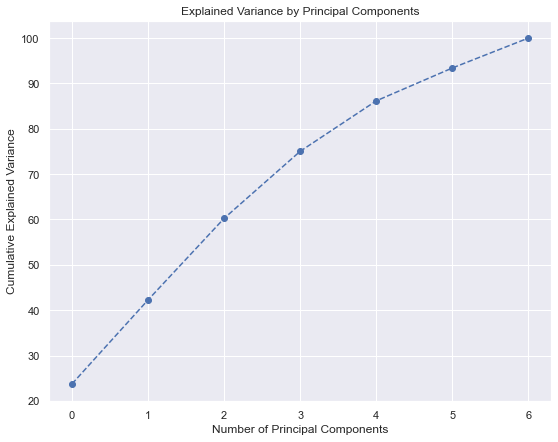

In [39]:
plt.subplots(figsize=(9, 7))
plt.plot(range(0,7),(pca.explained_variance_ratio_*100).cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')

The graph shows the amount of variance captured (on the y-axis) depending on the number of components we include (the x-axis). A rule of thumb is to preserve around 80% of the variance. So, in this instance, we decide to keep 3 components.

### Correlation circles visualization

By executing the function display_circles() we obtain the correlation circles.

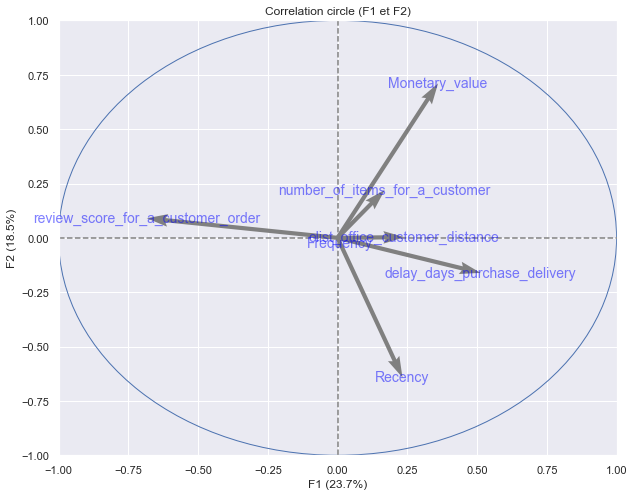

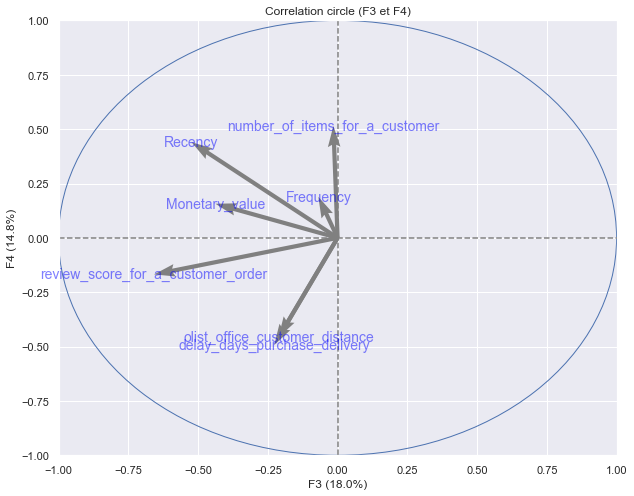

In [40]:
# Code extracted from OP example
# Cercle des corrélations
# https://github.com/stenier-oc/realisez-une-analyse-de-donnees-exploratoire/blob/master/pca_my_courses.py
components_pca = pca.components_
display_circles(components_pca, 7, pca, [(0,1),(2,3)], labels = np.array(features))

### Projected data visualization

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


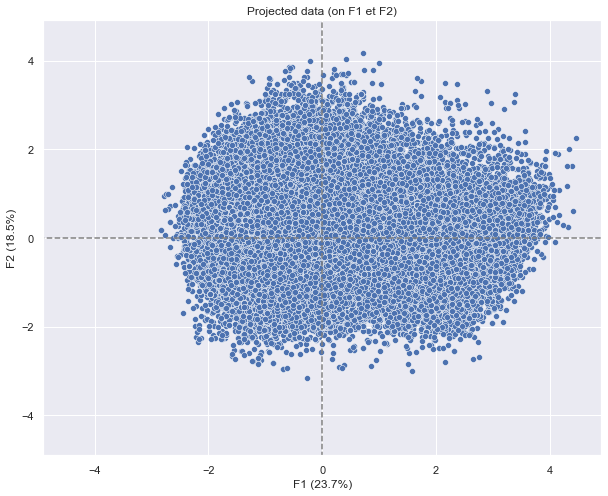

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


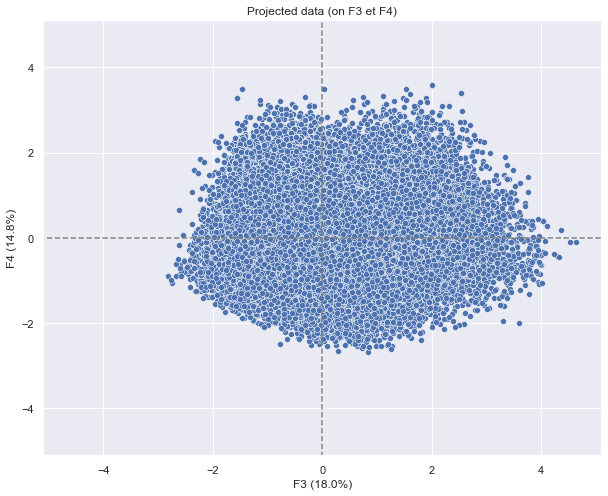

In [41]:
# Code extracted from OP example
# Projection des individus
# https://github.com/stenier-oc/realisez-une-analyse-de-donnees-exploratoire/blob/master/pca_my_courses.py
X_projected = pca_result
display_factorial_planes(X_projected, 7, pca, [(0,1),(2,3)])

### Projected data visualization by customer segment name

For a better visualization we are going to add some colors by label to the prjected data on the principal components.

In [42]:
df_for_PCA['F1'] = pca_result[:,0]
df_for_PCA['F2'] = pca_result[:,1]
df_for_PCA['F3'] = pca_result[:,2]
df_for_PCA['F4'] = pca_result[:,3]

In [43]:
df_for_PCA.head()

,review_score_for_a_customer_order,customer_unique_id,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,Segment_name,Frequency,Monetary_value,Recency,RFM_Score,F1,F2,F3,F4
3033,0.545373,598ffe324e745b97fd07d03416c49d16,2.834506,0.419791,1.351644,Hibernating,-0.500876,0.563391,-0.883972,2.0,0.574544,1.648578,-0.447732,0.317734
3034,0.063158,17e5182d5817ab03fa16ee8e960e1b87,2.834506,-0.470284,1.780848,Potential Loyalists,-0.500876,2.108691,0.754427,3.0,1.488277,1.795519,-1.553852,1.603654
3035,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908
3036,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.405598,-0.792572,3.0,0.397385,1.395796,-0.305011,0.993446
3037,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908


Text(0.5, 1.0, 'PCA analysis')

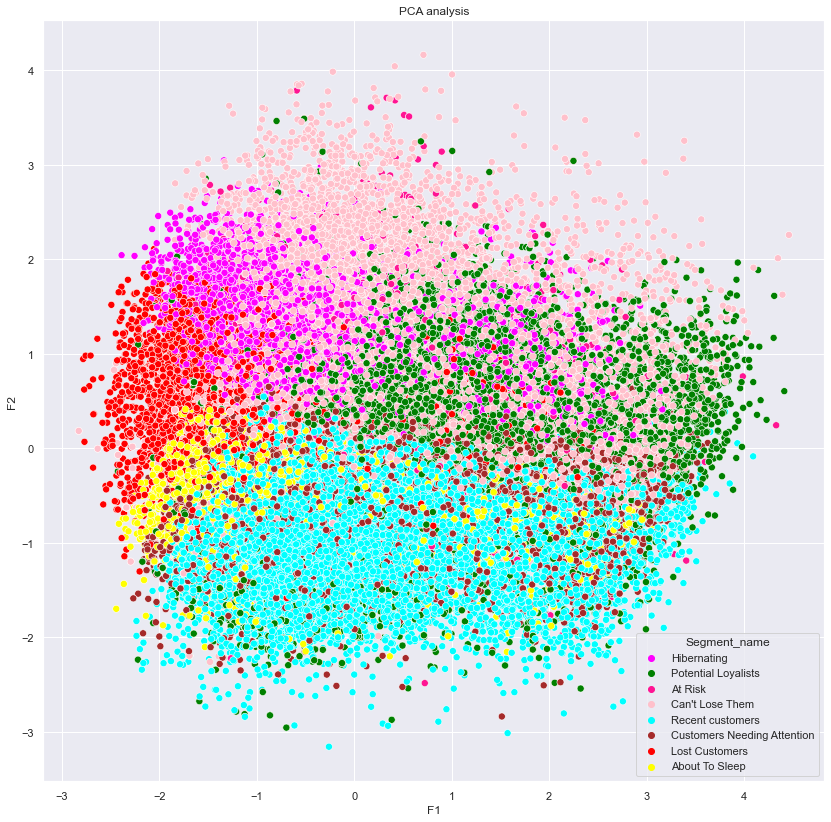

In [117]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost Customers":"red",
           "Hibernating":"magenta",
           "About To Sleep":"yellow",
           "Can\'t Lose Them":"pink",
           "At Risk":"deeppink",
           "Customers Needing Attention":"brown",
           "Recent customers":"cyan",
           "Potential Loyalists":"green",
           "Loyal Customers":"blue"}
sns.scatterplot(x="F1", y="F2", hue="Segment_name", data=df_for_PCA, palette=my_pal, s=50)
plt.title('PCA analysis')

Text(0.5, 1.0, 'PCA analysis')

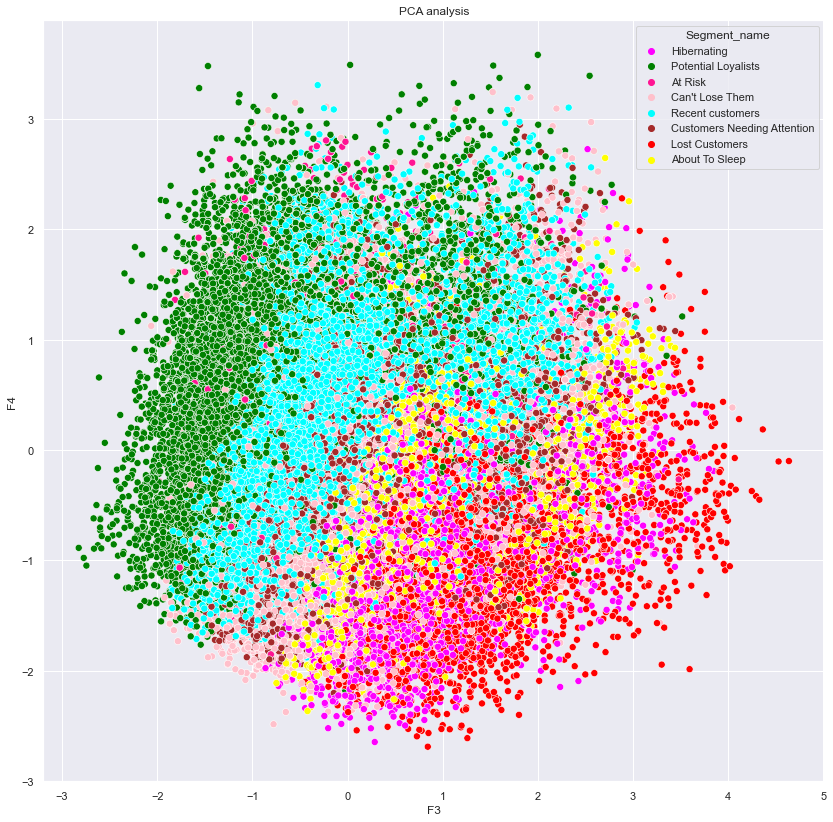

In [118]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost Customers":"red",
           "Hibernating":"magenta",
           "About To Sleep":"yellow",
           "Can\'t Lose Them":"pink",
           "At Risk":"deeppink",
           "Customers Needing Attention":"brown",
           "Recent customers":"cyan",
           "Potential Loyalists":"green",
           "Loyal Customers":"blue"}
sns.scatterplot(x="F3", y="F4", hue="Segment_name", data=df_for_PCA, palette=my_pal, s=50)
plt.title('PCA analysis')

## K-means clusterization

### Creation of a dataframe for K-means analysis

We will start by importing the necessary modules for K-means clusterization. 

In [46]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

We will produce a new dataframe which we will use for K-means analysis.

In [47]:
df_k_means_reduced_PCA = df_for_PCA.copy()

We need to find the best parameters for the K-means clusterer, and the way to go is using either the silhouette method or the elbow method. We will test the elbow method.

### Elbow method: determining the best K number of clusters

The elbow method runs K-means clustering on the dataset for a range of values of K. It performs K-means clustering with all these different values of K. For each of the K values, we calculate average distances to the centroid across all data points. Then the idea is to plot these points corresponding to the number of the K cluster. Then we need to find the point where the average distance from the centroid falls suddenly (Elbow-shaped).

See reference: https://www.analyticsvidhya.com/blog/2021/05/k-mean-getting-the-optimal-number-of-clusters/#:~:text=Silhouette%20analysis,for%20each%20value%20of%20K

In [49]:
Sum_of_squared_distances_kmeans_clusterer_elbow = []
K = range(1,20) # Range of clusters to find the best fit

for k in K:
    k_means_clusterer_elbow = KMeans(n_clusters=k)
    k_means_clusterer_elbow = k_means_clusterer_elbow.fit(df_k_means_reduced_PCA.drop(columns=['customer_unique_id', 'Segment_name', 'RFM_Score', 'F1', 'F2', 'F3', 'F4']).values)
    Sum_of_squared_distances_kmeans_clusterer_elbow.append(k_means_clusterer_elbow.inertia_)

For the visualization of the elbow method of our K-Means clusterer, we have:

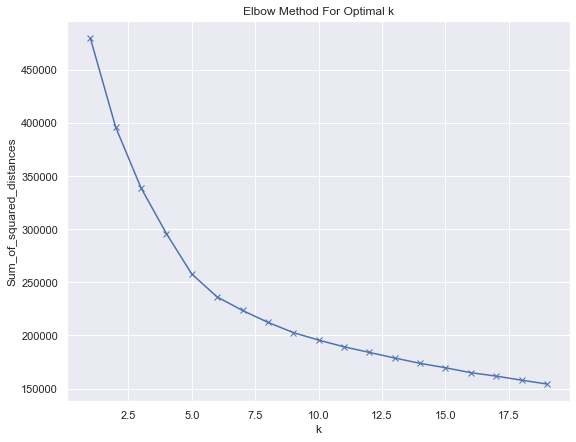

In [50]:
plt.subplots(figsize=(9, 7))
plt.plot(K, Sum_of_squared_distances_kmeans_clusterer_elbow, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

As the number of clusters increases, the variance (within-cluster sum of squares) decreases. Hence there is a point when the decrease of the sum of squared distances is not significant for increasing k-cluster value. That’s how we get the optimal value of k.

### K-means run

As observed, the optimal number of clusters to run the K-means algorithm from elbow method is 5 clusters.

In [51]:
clusterer_k_means_with_elbow_result = KMeans(n_clusters=5, random_state=42)

#Predict the labels of clusters
cluster_labels_with_elbow_result = clusterer_k_means_with_elbow_result.\
                                    fit_predict(df_k_means_reduced_PCA.drop(columns=['customer_unique_id', 
                                                                                        'Segment_name', 
                                                                                        'RFM_Score', 
                                                                                        'F1', 
                                                                                        'F2', 
                                                                                        'F3', 
                                                                                        'F4']).values)

In [52]:
df_k_means_reduced_PCA['Segment_k_means_label'] = cluster_labels_with_elbow_result

In [53]:
df_k_means_reduced_PCA.head()

,review_score_for_a_customer_order,customer_unique_id,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,Segment_name,Frequency,Monetary_value,Recency,RFM_Score,F1,F2,F3,F4,Segment_k_means_label
3033,0.545373,598ffe324e745b97fd07d03416c49d16,2.834506,0.419791,1.351644,Hibernating,-0.500876,0.563391,-0.883972,2.0,0.574544,1.648578,-0.447732,0.317734,4
3034,0.063158,17e5182d5817ab03fa16ee8e960e1b87,2.834506,-0.470284,1.780848,Potential Loyalists,-0.500876,2.108691,0.754427,3.0,1.488277,1.795519,-1.553852,1.603654,4
3035,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908,4
3036,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.405598,-0.792572,3.0,0.397385,1.395796,-0.305011,0.993446,4
3037,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908,4


### Projected data visualization with K-means labels

We then visualize the clusterization from K-means, using the first four principal components obtained from the PCA analysis. 

Text(0.5, 1.0, 'Clusters by Principal Components')

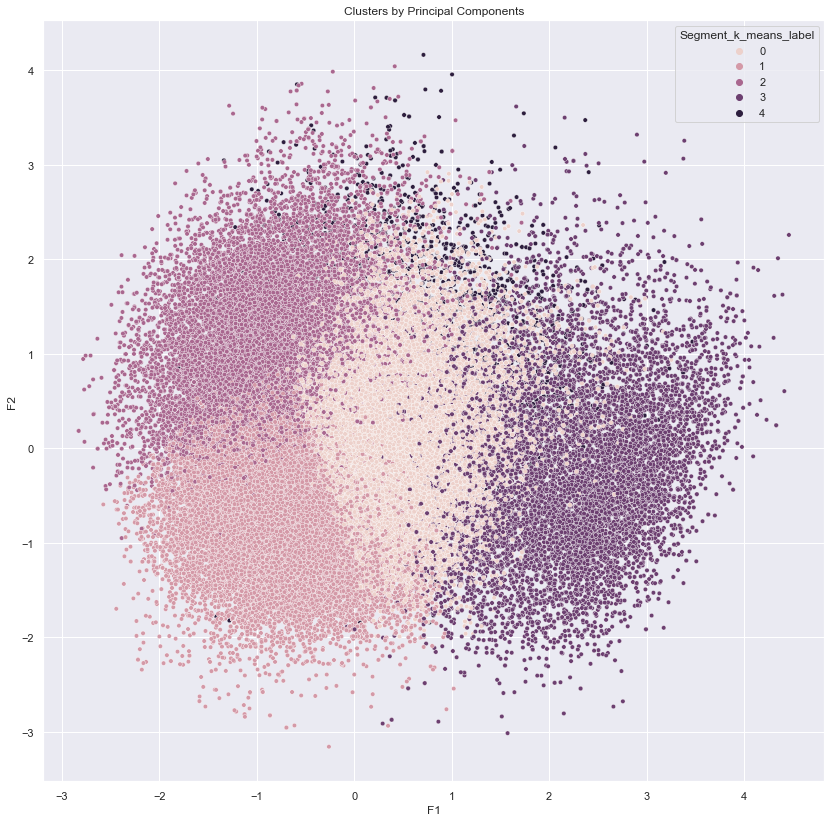

In [54]:
plt.show()
plt.subplots(figsize=(14, 14))
sns.scatterplot(x = df_k_means_reduced_PCA['F1'], y = df_k_means_reduced_PCA['F2'], hue = df_k_means_reduced_PCA['Segment_k_means_label'], s = 20)
plt.title('Clusters by Principal Components')

Text(0.5, 1.0, 'Clusters by Principal Components')

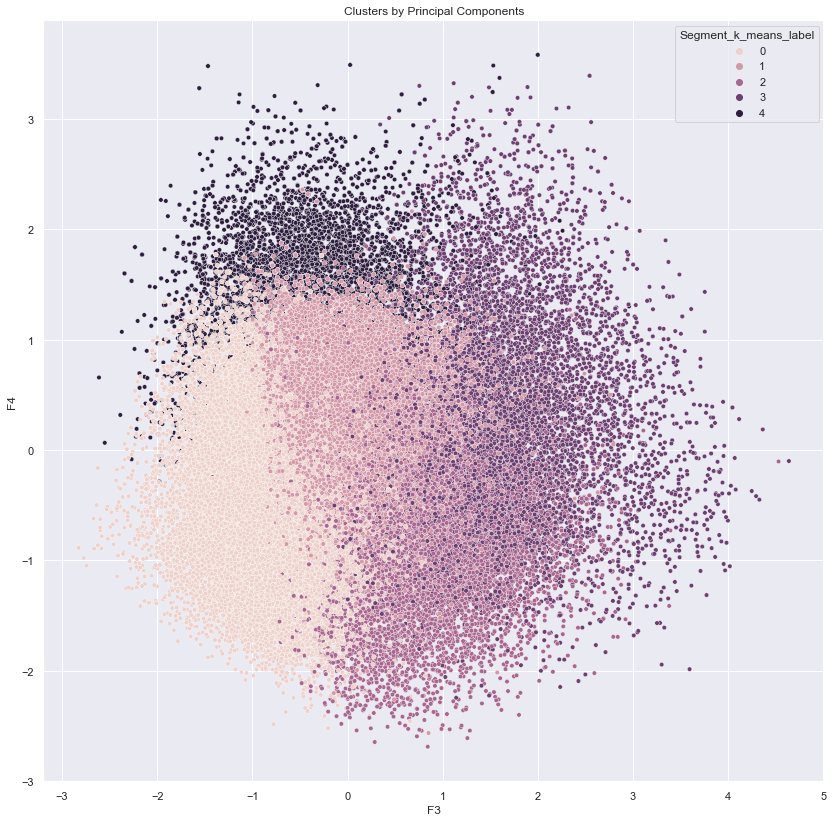

In [55]:
plt.show()
plt.subplots(figsize=(14, 14))
sns.scatterplot(x = df_k_means_reduced_PCA['F3'], y = df_k_means_reduced_PCA['F4'], hue = df_k_means_reduced_PCA['Segment_k_means_label'], s = 20)
plt.title('Clusters by Principal Components')

We observed that K-means clusterer asigned five labels to the data points (each label corresponding to a cluster). Next, the idea is to give some significance to the groups formed by K-means.

### Interpretation of K-means segmentation

We will create a dataframe that will contain the statistics for each group of labels created from K-means. For this we will perform a merge between the dataframe that we have used for the K-means clusterization and the previously obtained dataframe from RFM segmentation. We can perform this merge by customer_unique_id. 

In fact, this will be helpful to asign after the customer segment names to each label.

In [144]:
new_df_k_means_reduced_PCA = df_k_means_reduced_PCA.copy()

new_df_k_means_reduced_PCA = new_df_k_means_reduced_PCA.drop(columns=['review_score_for_a_customer_order',
                                                                      'number_of_items_for_a_customer', 
                                                                      'delay_days_purchase_delivery',
                                                                      'olist_office_customer_distance', 
                                                                      'Segment_name', 
                                                                      'RFM_Score', 
                                                                      'Frequency',
                                                                      'Monetary_value', 
                                                                      'Recency', 
                                                                      'F1', 
                                                                      'F2', 
                                                                      'F3', 
                                                                      'F4'])

df_merge_segmentation_interpretation = new_df_k_means_reduced_PCA.copy()

df_merge_segmentation_interpretation = df_merge_segmentation_interpretation.merge(automatic_segmentation_new_df, on='customer_unique_id', how='left') 

In [145]:
df_merge_segmentation_interpretation = df_merge_segmentation_interpretation.drop(columns=['customer_unique_id',
                                                                                           'Segment_name',
                                                                                           'RFM_Score'])
       
df_stats_segmentation = df_merge_segmentation_interpretation.copy()

In [146]:
df_stats_segmentation = df_stats_segmentation.groupby('Segment_k_means_label')[['Frequency', 
                                                                                'Monetary_value', 
                                                                                'Recency', 
                                                                                'review_score_for_a_customer_order', 
                                                                                'number_of_items_for_a_customer',
                                                                                'delay_days_purchase_delivery', 
                                                                                'olist_office_customer_distance']].agg([np.mean])

new_df_stats_segmentation = df_stats_segmentation.copy()

new_df_stats_segmentation["size"] = df_merge_segmentation_interpretation.groupby('Segment_k_means_label')[['Recency']].agg([np.size]) 

new_df_stats_segmentation.round(0).head()

,Frequency,Monetary_value,Recency,review_score_for_a_customer_order,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,size
,mean,mean,mean,mean,mean,mean,mean,
Segment_k_means_label,,,,,,,,
0,2.0,179.0,295.0,5.0,1.0,16.0,1046.0,116282
1,2.0,85.0,294.0,5.0,1.0,10.0,523.0,137433
2,2.0,148.0,106.0,5.0,1.0,9.0,615.0,44853
3,2.0,160.0,253.0,2.0,1.0,16.0,782.0,31823
4,3.0,180.0,261.0,4.0,2.0,12.0,760.0,91532


In order to asign customer segment names to the labels obtained from K-means, we will connect first the detailed segmentation obtained from RFM with the main five groups obtained before from the heuristic RFM method. This is:

* **Top customer:** Potential Loyalists (0)
* **High value customer:** Customers Needing Attention (4)
* **Medium value customer:** Recent customers (1)
* **Low-value customer:** About To Sleep, At Risk, Can't Lose Them (3)
* **Lost customer:** Lost Customers, Hibernating (2)

We have the behavior for each client subsegment:

* **Potential Loyalists:** Recent customers with average frequency. Spend the most.
* **Customers Needing Attention:** Above average recency, frequency and monetary values. May not have bought very recently though.
* **Recent Customers:** Bought recently, but not often.
* **Can't Lose Them:** Used to purchase frequently but haven't returned for a long time.
* **At Risk:** Purchased often but a long time ago. Need to bring them back.
* **About To Sleep:** Below average recency and frequency. Will lose them if not reactivated.
* **Hibernating:** Last purchase was long back and low number of orders.
* **Lost Customers:** Purchased long time ago and never came back.

We will then asign each label obtained from K-means to the five main groups obtained from the RFM heuristic method.

In [147]:
df_k_means_reduced_PCA['Segment_client_k_means'] = \
    df_k_means_reduced_PCA['Segment_k_means_label'].map({
        0: 'Top customer: Potential Loyalists',
        1: 'Medium value customer: Recent customers',
        2: 'Lost customer: Lost Customers, Hibernating',
        3: 'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
        4: 'High value customer: Customers Needing Attention'})

We plot the data points with the corresponding customer segment names.

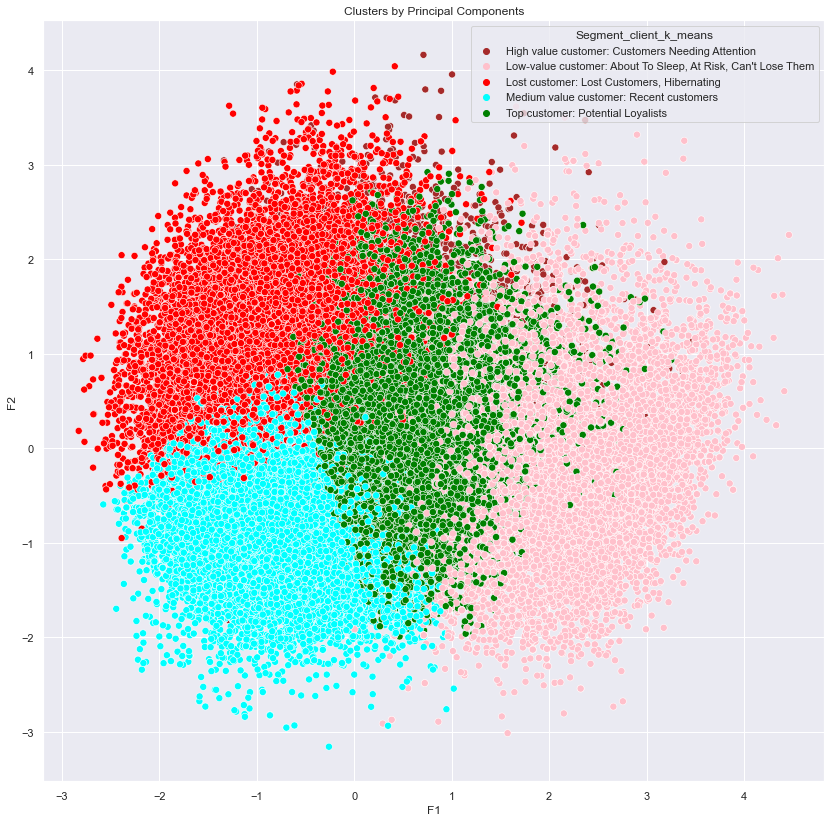

In [148]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost customer: Lost Customers, Hibernating":"red",
           "Low-value customer: About To Sleep, At Risk, Can\'t Lose Them":"pink",
           "High value customer: Customers Needing Attention":"brown",
           "Medium value customer: Recent customers":"cyan",
           "Top customer: Potential Loyalists":"green"}
sns.scatterplot(x = df_k_means_reduced_PCA['F1'], y = df_k_means_reduced_PCA['F2'], hue = df_k_means_reduced_PCA['Segment_client_k_means'], palette=my_pal, s = 50)
plt.title('Clusters by Principal Components')
plt.show()

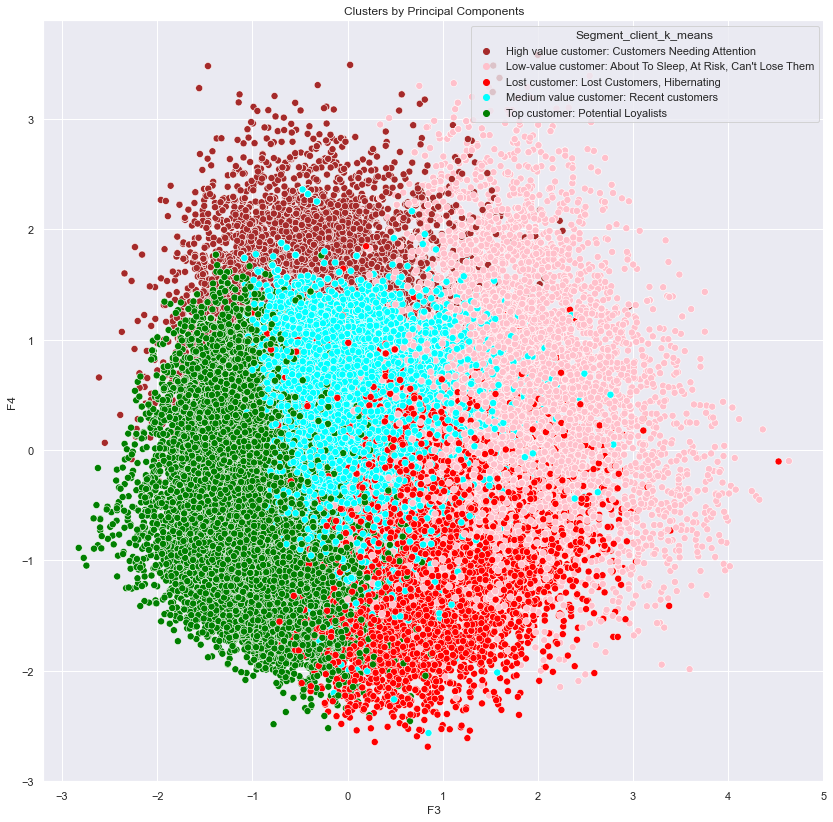

In [149]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost customer: Lost Customers, Hibernating":"red",
           "Low-value customer: About To Sleep, At Risk, Can\'t Lose Them":"pink",
           "High value customer: Customers Needing Attention":"brown",
           "Medium value customer: Recent customers":"cyan",
           "Top customer: Potential Loyalists":"green"}
sns.scatterplot(x = df_k_means_reduced_PCA['F3'], y = df_k_means_reduced_PCA['F4'], hue = df_k_means_reduced_PCA['Segment_client_k_means'], palette=my_pal, s = 50)
plt.title('Clusters by Principal Components')
plt.show()

We will now add three more columns corresponding to the customer segments (and subsegments for a better understanding o their behavior) and a description. We keep the following order.

* **Top customer:** Potential Loyalists (0) **-->** 'Recent customers with average frequency. Spend the most.'
* **High value customer:** Customers Needing Attention (4) **-->** 'Above average recency, frequency and monetary values. May not have bought very recently though.'
* **Medium value customer:** Recent customers (1) **-->** 'Bought recently, but not often.'
* **Low-value customer:** About To Sleep, At Risk, Can't Lose Them (3) **-->** 'Used to purchase frequently but haven't returned for a long time. Need to bring them back and will lose them if not reactivated.'
* **Lost customer:** Lost Customers, Hibernating (2) **-->** 'Purchased long time ago and never came back. Also low number of orders.'

In [150]:
# 0: 'Top customer: Potential Loyalists',
# 1: 'Medium value customer: Recent customers',
# 2: 'Lost customer: Lost Customers, Hibernating',
# 3: 'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
# 4: 'High value customer: Customers Needing Attention'

new_df_stats_segmentation['Client_segment'] = ['Top customer', # (0) 
                                                'Medium value customer', # (1) 
                                                'Lost customer', # (2) 
                                                'Low-value customer', # (3) 
                                                'High value customer' # (4) 
                                                ]
                                                
new_df_stats_segmentation['Client_subsegment'] = ['Potential Loyalists', # (0) 
                                                    'Recent customers', # (1) 
                                                    'Lost Customers, Hibernating', # (2) 
                                                    'About To Sleep, At Risk, Can\'t Lose Them', # (3) 
                                                    'Customers Needing Attention' # (4) 
                                                    ]
                                                
new_df_stats_segmentation['Description'] = ['Recent customers with average frequency. Spend the most.', # (0) 
                                            'Bought recently, but not often.', # (1) 
                                            'Purchased long time ago and never came back. Also low number of orders.', # (2) 
                                            'Used to purchase frequently but have not returned for a long time. Need to bring them back and will lose them if not reactivated.', # (3) 
                                            'Above average recency, frequency and monetary values. May not have bought very recently though.' # (4) 
                                            ]

In [151]:
new_df_stats_segmentation.round(0).drop(columns=['review_score_for_a_customer_order',
                                                    'number_of_items_for_a_customer',
                                                    'delay_days_purchase_delivery',
                                                    'olist_office_customer_distance']).head()

,Frequency,Monetary_value,Recency,size,Client_segment,Client_subsegment,Description
,mean,mean,mean,,,,
Segment_k_means_label,,,,,,,
0,2.0,179.0,295.0,116282,Top customer,Potential Loyalists,Recent customers with average frequency. Spend...
1,2.0,85.0,294.0,137433,Medium value customer,Recent customers,"Bought recently, but not often."
2,2.0,148.0,106.0,44853,Lost customer,"Lost Customers, Hibernating",Purchased long time ago and never came back. A...
3,2.0,160.0,253.0,31823,Low-value customer,"About To Sleep, At Risk, Can't Lose Them",Used to purchase frequently but have not retur...
4,3.0,180.0,261.0,91532,High value customer,Customers Needing Attention,"Above average recency, frequency and monetary ..."


In [152]:
new_df_stats_segmentation.round(0).drop(columns=['Client_subsegment',
                                                    'Description']).head()

,Frequency,Monetary_value,Recency,review_score_for_a_customer_order,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,size,Client_segment
,mean,mean,mean,mean,mean,mean,mean,,
Segment_k_means_label,,,,,,,,,
0,2.0,179.0,295.0,5.0,1.0,16.0,1046.0,116282,Top customer
1,2.0,85.0,294.0,5.0,1.0,10.0,523.0,137433,Medium value customer
2,2.0,148.0,106.0,5.0,1.0,9.0,615.0,44853,Lost customer
3,2.0,160.0,253.0,2.0,1.0,16.0,782.0,31823,Low-value customer
4,3.0,180.0,261.0,4.0,2.0,12.0,760.0,91532,High value customer


## T-SNE for dimensionality reduction

### Creation of a dataframe for T-SNE analysis

T-distributed Stochastic Neighbor Embedding is a non-linear dimensionality reducion technique. T-SNE models the probability distribution  of neighbors around each point.

One of the hyperparameters is the perplexity. This parameter is, in a sense, a guess about the number of close neighbors each point has. 

See reference: https://distill.pub/2016/misread-tsne/

In [88]:
from sklearn.manifold import TSNE

In [95]:
df_for_TSNE = df_for_PCA.copy()

In [96]:
df_for_TSNE.shape

(102333, 14)

### Use of 50% of the data

In [98]:
# To choose a sample of data

df_for_TSNE_smaller_data = df_for_TSNE.copy()

df_for_TSNE_smaller_data = df_for_TSNE_smaller_data.sample(frac=0.5, replace=True)

In [101]:
tsne = TSNE(verbose=0, random_state=42, perplexity=50)
tsne_result_smaller_data = tsne.fit_transform(df_for_TSNE_smaller_data.drop(columns=['customer_unique_id', 
                                                                                        'Segment_name', 
                                                                                        'RFM_Score', 
                                                                                        'F1', 
                                                                                        'F2', 
                                                                                        'F3', 
                                                                                        'F4']).values) 

new_df_for_TSNE_smaller_data = pd.DataFrame()

new_df_for_TSNE_smaller_data["y"] = df_for_TSNE_smaller_data['Segment_name']
new_df_for_TSNE_smaller_data["comp-1"] = tsne_result_smaller_data[:,0]
new_df_for_TSNE_smaller_data["comp-2"] = tsne_result_smaller_data[:,1]

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [102]:
my_pal = {"Lost Customers":"red",
           "Hibernating":"magenta",
           "About To Sleep":"yellow",
           "Can\'t Lose Them":"pink",
           "At Risk":"deeppink",
           "Customers Needing Attention":"brown",
           "Recent customers":"cyan",
           "Potential Loyalists":"green",
           "Loyal Customers":"blue"}

[Text(0.5, 1.0, 'Data T-SNE projection')]

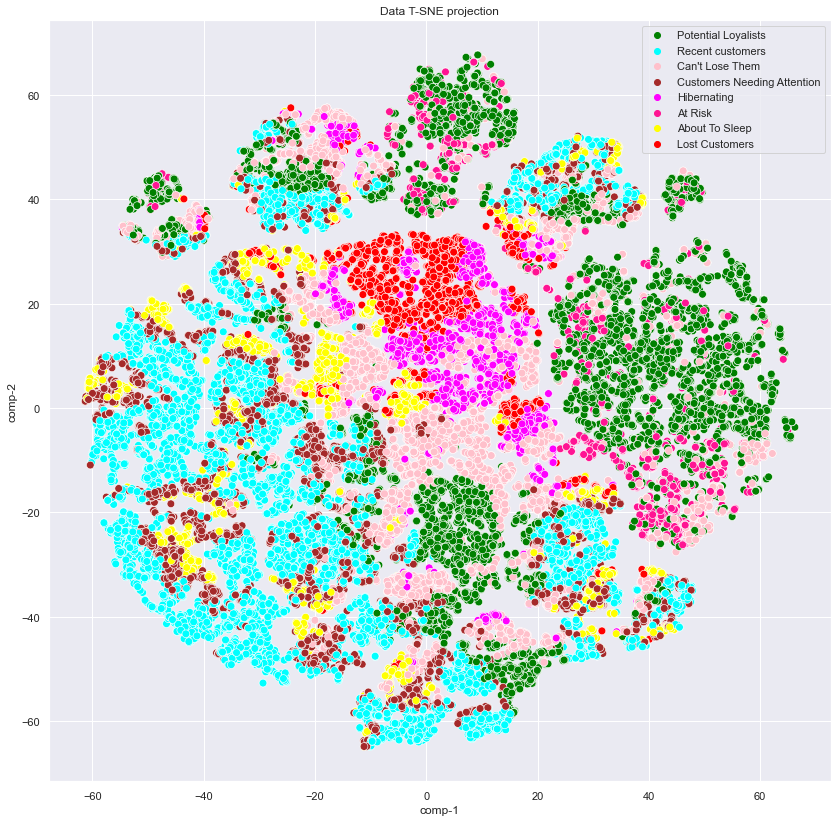

In [103]:
plt.subplots(figsize=(14, 14))
sns.scatterplot(x="comp-1", y="comp-2", hue=new_df_for_TSNE_smaller_data.y.tolist(), s = 60,
                palette=my_pal,
                data=new_df_for_TSNE_smaller_data).set(title="Data T-SNE projection")

### Use of all the data

In [104]:
tsne = TSNE(verbose=0, random_state=42, perplexity=50)
tsne_result_all_data = tsne.fit_transform(df_for_TSNE.drop(columns=['customer_unique_id', 
                                                                        'Segment_name', 
                                                                        'RFM_Score', 
                                                                        'F1', 
                                                                        'F2', 
                                                                        'F3', 
                                                                        'F4']).values) 

new_df_for_TSNE_all_data = pd.DataFrame()

new_df_for_TSNE_all_data["y"] = df_for_TSNE['Segment_name']
new_df_for_TSNE_all_data["comp-1"] = tsne_result_all_data[:,0]
new_df_for_TSNE_all_data["comp-2"] = tsne_result_all_data[:,1]

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[Text(0.5, 1.0, 'Data T-SNE projection')]

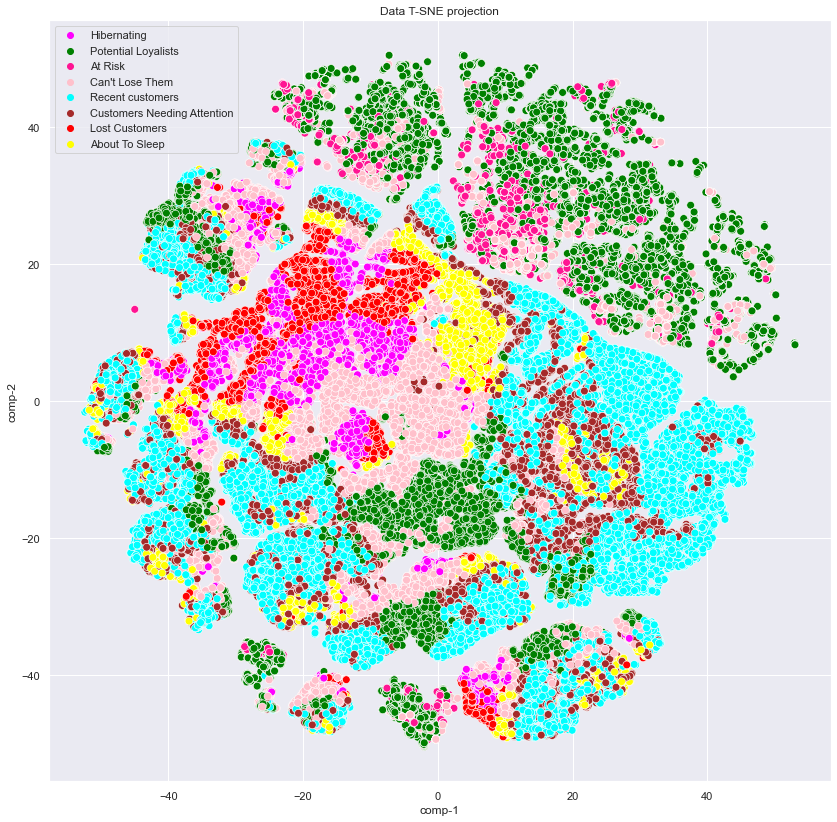

In [105]:
plt.subplots(figsize=(14, 14))
sns.scatterplot(x="comp-1", y="comp-2", hue=new_df_for_TSNE_all_data.y.tolist(), s = 60,
                palette=my_pal,
                data=new_df_for_TSNE_all_data).set(title="Data T-SNE projection")

## DBSCAN clusterization

### Creation of a dataframe for DBSCAN analysis

We will now test the DBSCAN algorithm. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is an unsupervised machine learning technique used to identify clusters of varying shape in a dataset.

The advantages of DBSCAN over other clustering algorithms are:

* DBSCAN does not require a pre-determined set number of clusters.
* DBSCAN identifies outliers as noise, instead of classifying them into a cluster.
* DBSCAN is more flexible when it comes to the size and shape of clusters than other partitioning methods, such as K-means. It is able to identify clusters that differ in size and shape from one another, which makes it more useful for messy data.

See reference:

https://medium.com/@tarammullin/dbscan-2788cfce9389

In [106]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

We will create a dataframe that we can manipulate after for DBSCAN analysis.

In [222]:
df_dbscan_reduced_PCA = df_for_PCA.copy()

In [223]:
df_dbscan_reduced_PCA["comp-1"] = tsne_result_all_data[:,0]
df_dbscan_reduced_PCA["comp-2"] = tsne_result_all_data[:,1]

In [224]:
# To choose a sample of data

# df_dbscan_reduced_PCA = df_dbscan_reduced_PCA.sample(frac=0.8, replace=True)

In [225]:
df_dbscan_reduced_PCA.shape

(102333, 16)

### DBSCAN Parameter Estimation

https://medium.com/@tarammullin/dbscan-2788cfce9389

DBSCAN’s two parameters are: https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd

* Minimum samples ('min_samples'): the fewest number of points required to form a cluster. min_samples value should be set using domain knowledge and familiarity with the dataset. The larger the dataset, the larger the value of min_samples should be. If the data set is noisier, we need to choose a larger value of min_samples. Generally, min_samples should be greater than or equal to the dimensionality of the data set. For 2-dimensional data, we should use DBSCAN’s default value of min_samples = 4. If the data has more than 2 dimensions, we should choose min_samples = 2*dim, where dim = the_dimensions_of_dataset. In our case, we have 7 features, which means min_samples >= 14.

* ε (epsilon or 'eps'): the maximum distance two points can be from one another while still belonging to the same cluster. To determine eps parameter we can use NearestNeighbors from Scikit-learn, to calculate the average distance between each point and its n_neighbors. This technique calculates the average distance between each point and its k nearest neighbors. The average k-distances are then plotted in ascending order on a k-distance graph. We will find the optimal value for ε at the point of maximum curvature (i.e. where the graph has the greatest slope).

See also reference: https://stats.stackexchange.com/questions/88872/a-routine-to-choose-eps-and-minpts-for-dbscan

In [226]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=40)

neighbors_fit = neighbors.fit(df_dbscan_reduced_PCA.drop(columns=['customer_unique_id', 
                                                                    'Segment_name', 
                                                                    'RFM_Score', 
                                                                    'F1', 
                                                                    'F2', 
                                                                    'F3', 
                                                                    'F4', 
                                                                    'comp-1', 
                                                                    'comp-2']).values)

distances, indices = neighbors_fit.kneighbors(df_dbscan_reduced_PCA.drop(columns=['customer_unique_id', 
                                                                                    'Segment_name', 
                                                                                    'RFM_Score', 
                                                                                    'F1', 
                                                                                    'F2', 
                                                                                    'F3', 
                                                                                    'F4', 
                                                                                    'comp-1', 
                                                                                    'comp-2']).values)

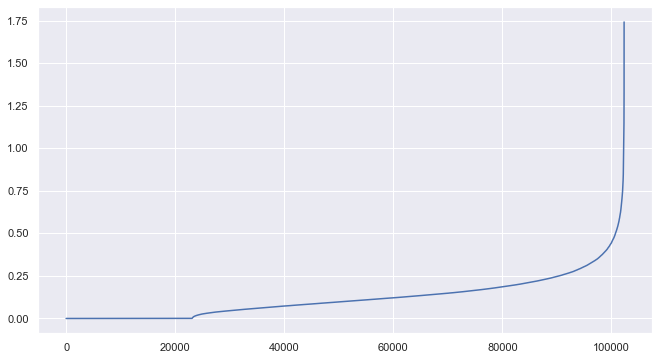

In [227]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

### DBSCAN run

In [228]:
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

# We can try with 0.8, 1, 1.5, where some clusters where observed. min_samples => 14. min_samples = 80 worked fine

dbscan_clusterer = DBSCAN(eps = 1.25, min_samples = 80).fit(df_dbscan_reduced_PCA.drop(columns=['customer_unique_id', 
                                                                                                'Segment_name', 
                                                                                                'RFM_Score', 
                                                                                                'F1', 
                                                                                                'F2', 
                                                                                                'F3', 
                                                                                                'F4', 
                                                                                                'comp-1', 
                                                                                                'comp-2']).values)

labels_db_scan = dbscan_clusterer.labels_

In [229]:
# Number of clusters in labels, ignoring noise if present.

n_clusters_ = len(set(labels_db_scan)) - (1 if -1 in labels_db_scan else 0)
n_noise_ = list(labels_db_scan).count(-1)

In [230]:
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 4
Estimated number of noise points: 805


### DBSCAN result visualization

We will now visualize the clusterization from DBSCAN algorithm using the four two principal components obtained from PCA analysis.

In [231]:
df_dbscan_reduced_PCA['Segment_dbscan_label'] = labels_db_scan

In [232]:
df_dbscan_reduced_PCA.head()

,review_score_for_a_customer_order,customer_unique_id,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,Segment_name,Frequency,Monetary_value,Recency,RFM_Score,F1,F2,F3,F4,comp-1,comp-2,Segment_dbscan_label
3033,0.545373,598ffe324e745b97fd07d03416c49d16,2.834506,0.419791,1.351644,Hibernating,-0.500876,0.563391,-0.883972,2.0,0.574544,1.648578,-0.447732,0.317734,-26.627356,36.352753,0
3034,0.063158,17e5182d5817ab03fa16ee8e960e1b87,2.834506,-0.470284,1.780848,Potential Loyalists,-0.500876,2.108691,0.754427,3.0,1.488277,1.795519,-1.553852,1.603654,-27.543812,36.477844,-1
3035,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908,-17.796974,34.832088,-1
3036,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.405598,-0.792572,3.0,0.397385,1.395796,-0.305011,0.993446,-21.961893,41.110153,0
3037,0.545373,acea13a79aeaf715ba68122e9deb330a,2.834506,0.719438,0.075367,At Risk,0.677186,0.809603,-2.531290,3.0,0.138442,2.799275,0.428196,0.291908,-17.796974,34.832088,-1


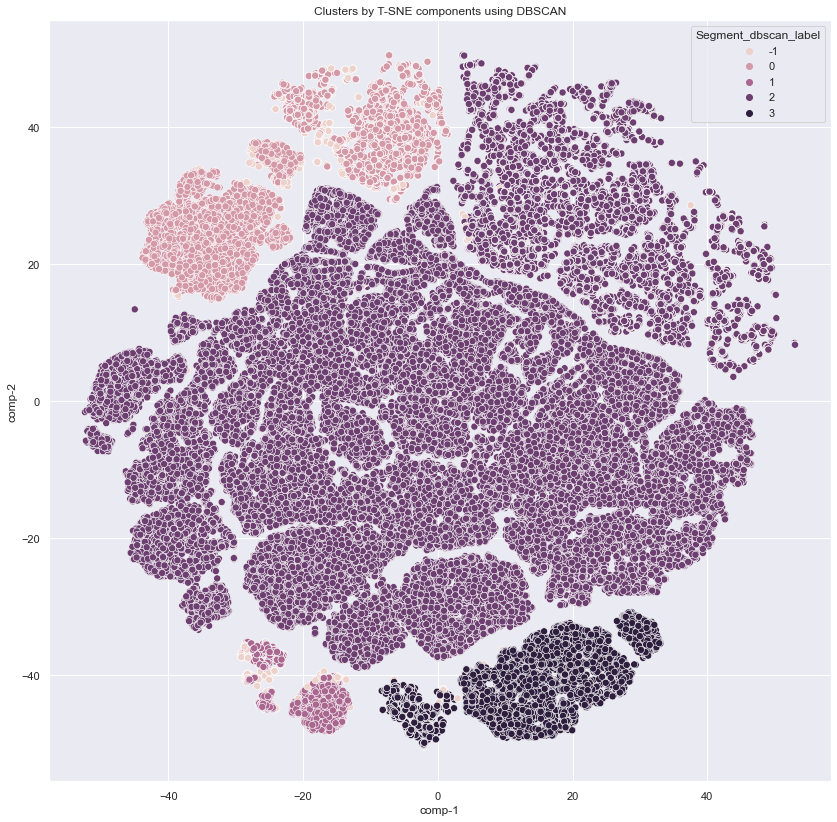

In [233]:
plt.subplots(figsize=(14, 14))
sns.scatterplot(x = df_dbscan_reduced_PCA['comp-1'], y = df_dbscan_reduced_PCA['comp-2'], hue = df_dbscan_reduced_PCA['Segment_dbscan_label'], s = 50)
plt.title('Clusters by T-SNE components using DBSCAN')
plt.show()

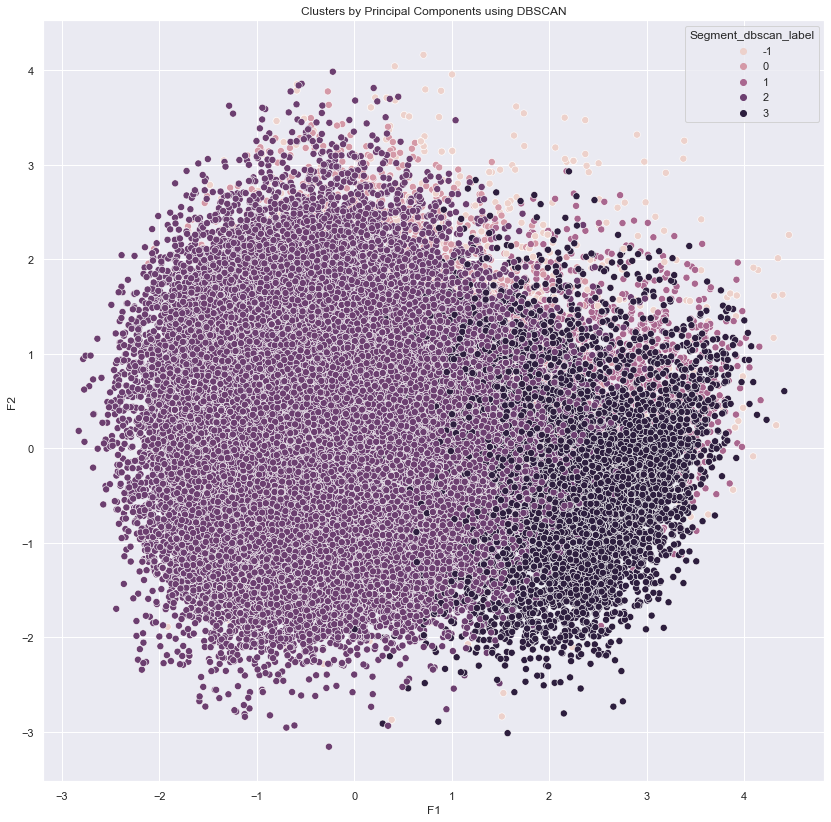

In [234]:
plt.subplots(figsize=(14, 14))
sns.scatterplot(x = df_dbscan_reduced_PCA['F1'], y = df_dbscan_reduced_PCA['F2'], hue = df_dbscan_reduced_PCA['Segment_dbscan_label'], s = 50)
plt.title('Clusters by Principal Components using DBSCAN')
plt.show()

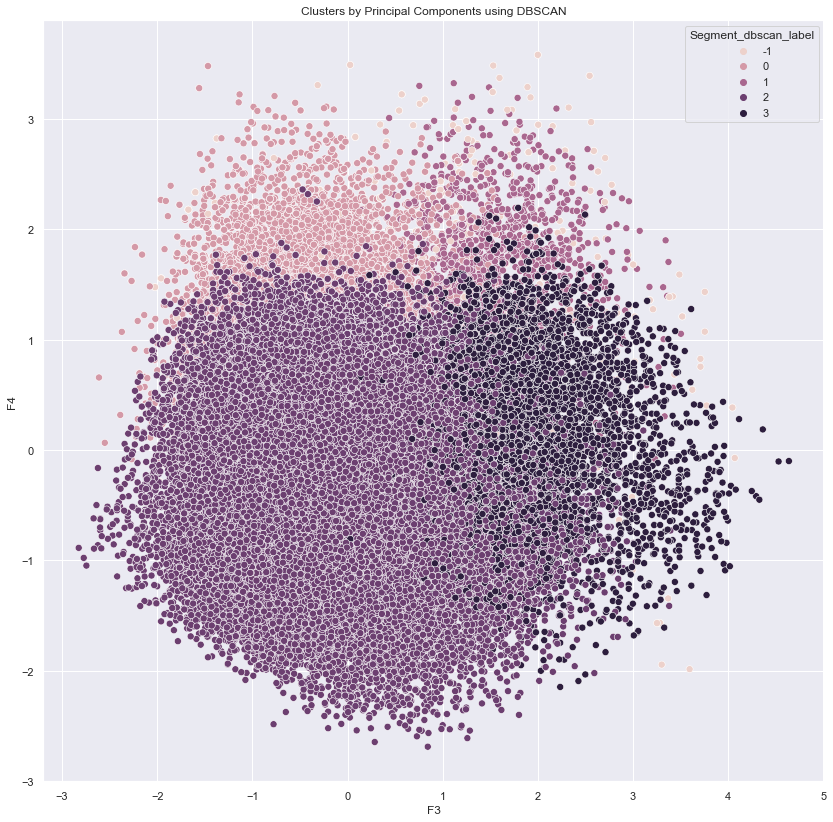

In [235]:
plt.subplots(figsize=(14, 14))
sns.scatterplot(x = df_dbscan_reduced_PCA['F3'], y = df_dbscan_reduced_PCA['F4'], hue = df_dbscan_reduced_PCA['Segment_dbscan_label'], s = 50)
plt.title('Clusters by Principal Components using DBSCAN')
plt.show()

### Interpretation of DBSCAN segmentation

In [248]:
new_df_dbscan_reduced_PCA = df_dbscan_reduced_PCA.copy()

In [249]:
new_df_dbscan_reduced_PCA = new_df_dbscan_reduced_PCA.drop(columns=['review_score_for_a_customer_order',
                                                                      'number_of_items_for_a_customer', 
                                                                      'delay_days_purchase_delivery',
                                                                      'olist_office_customer_distance', 
                                                                      'Segment_name', 
                                                                      'RFM_Score', 
                                                                      'Frequency',
                                                                      'Monetary_value', 
                                                                      'Recency', 
                                                                      'F1', 
                                                                      'F2', 
                                                                      'F3', 
                                                                      'F4',
                                                                      'comp-1',
                                                                      'comp-2'])
                                                                      
df_merge_dbscan_segmentation_interpretation = new_df_dbscan_reduced_PCA.copy()

In [250]:
df_merge_dbscan_segmentation_interpretation = df_merge_dbscan_segmentation_interpretation.merge(automatic_segmentation_new_df, on='customer_unique_id', how='left') 

df_merge_dbscan_segmentation_interpretation = df_merge_dbscan_segmentation_interpretation.drop(columns=['customer_unique_id',
                                                                                                        'Segment_name',
                                                                                                        'RFM_Score'])

df_stats_dbscan_segmentation = df_merge_dbscan_segmentation_interpretation.copy()

df_stats_dbscan_segmentation = df_merge_dbscan_segmentation_interpretation.groupby('Segment_dbscan_label')[['Frequency', 
                                                                                                'Monetary_value', 
                                                                                                'Recency', 
                                                                                                'review_score_for_a_customer_order', 
                                                                                                'number_of_items_for_a_customer',
                                                                                                'delay_days_purchase_delivery', 
                                                                                                'olist_office_customer_distance']].agg([np.mean])

In [251]:
new_df_stats_dbscan_segmentation = df_stats_dbscan_segmentation.copy()

new_df_stats_dbscan_segmentation["size"] = df_merge_dbscan_segmentation_interpretation.groupby('Segment_dbscan_label')[['Recency']].agg([np.size]) 

new_df_stats_dbscan_segmentation.round(0).head()

,Frequency,Monetary_value,Recency,review_score_for_a_customer_order,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,size
,mean,mean,mean,mean,mean,mean,mean,
Segment_dbscan_label,,,,,,,,
-1,3.0,233.0,216.0,4.0,2.0,15.0,1278.0,15739
0,3.0,175.0,262.0,4.0,2.0,12.0,675.0,84555
1,3.0,191.0,256.0,2.0,2.0,14.0,587.0,7438
2,2.0,129.0,268.0,5.0,1.0,12.0,744.0,298537
3,2.0,131.0,253.0,2.0,1.0,18.0,752.0,15654


* **Top customer:** Potential Loyalists (0)
* **High value customer:** Customers Needing Attention (1)
* **Medium value customer:** Recent customers (2)
* **Low-value customer:** About To Sleep, At Risk, Can't Lose Them (3)
* **Lost customer:** Lost Customers, Hibernating (-1)

We have the behavior for each client subsegment:

* **Potential Loyalists:** Recent customers with average frequency. Spend the most.
* **Customers Needing Attention:** Above average recency, frequency and monetary values. May not have bought very recently though.
* **Recent Customers:** Bought recently, but not often.
* **Can't Lose Them:** Used to purchase frequently but haven't returned for a long time.
* **At Risk:** Purchased often but a long time ago. Need to bring them back.
* **About To Sleep:** Below average recency and frequency. Will lose them if not reactivated.
* **Hibernating:** Last purchase was long back and low number of orders.
* **Lost Customers:** Purchased long time ago and never came back.

In [253]:
df_dbscan_reduced_PCA['Segment_client_dbscan'] = \
    df_dbscan_reduced_PCA['Segment_dbscan_label'].map({
        -1: 'Lost customer: Lost Customers, Hibernating',
        0: 'Top customer: Potential Loyalists',
        1: 'High value customer: Customers Needing Attention',
        2: 'Medium value customer: Recent customers',
        3: 'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them'})

In [256]:
new_df_stats_dbscan_segmentation['Client_segment'] = ['Lost customer: Lost Customers, Hibernating', # (-1)
                                                        'Top customer: Potential Loyalists', # (0)
                                                        'High value customer: Customers Needing Attention', # (1)
                                                        'Medium value customer: Recent customers', #(2)
                                                        'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them' # (3)
                                                        ]

new_df_stats_dbscan_segmentation.round(0).head()

,Frequency,Monetary_value,Recency,review_score_for_a_customer_order,number_of_items_for_a_customer,delay_days_purchase_delivery,olist_office_customer_distance,size,Client_segment
,mean,mean,mean,mean,mean,mean,mean,,
Segment_dbscan_label,,,,,,,,,
-1,3.0,233.0,216.0,4.0,2.0,15.0,1278.0,15739,"Lost customer: Lost Customers, Hibernating"
0,3.0,175.0,262.0,4.0,2.0,12.0,675.0,84555,Top customer: Potential Loyalists
1,3.0,191.0,256.0,2.0,2.0,14.0,587.0,7438,High value customer: Customers Needing Attention
2,2.0,129.0,268.0,5.0,1.0,12.0,744.0,298537,Medium value customer: Recent customers
3,2.0,131.0,253.0,2.0,1.0,18.0,752.0,15654,"Low-value customer: About To Sleep, At Risk, C..."


We plot the data points with the corresponding customer segment names.

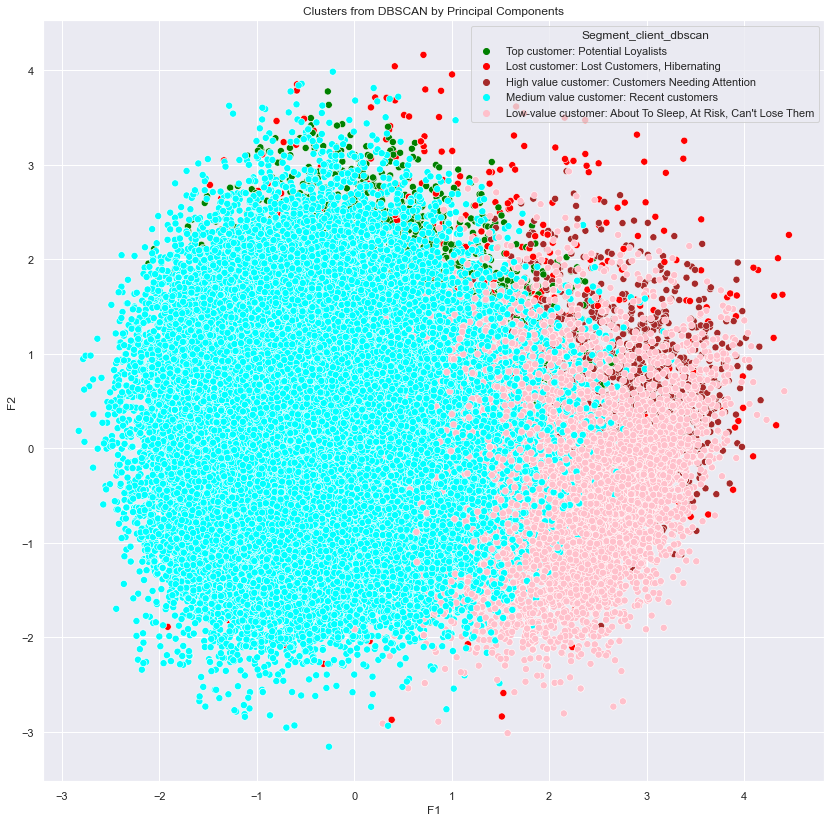

In [254]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost customer: Lost Customers, Hibernating":"red",
           "Low-value customer: About To Sleep, At Risk, Can\'t Lose Them":"pink",
           "High value customer: Customers Needing Attention":"brown",
           "Medium value customer: Recent customers":"cyan",
           "Top customer: Potential Loyalists":"green"}
sns.scatterplot(x = df_dbscan_reduced_PCA['F1'], y = df_dbscan_reduced_PCA['F2'], hue = df_dbscan_reduced_PCA['Segment_client_dbscan'], palette=my_pal, s = 50)
plt.title('Clusters from DBSCAN by Principal Components')
plt.show()

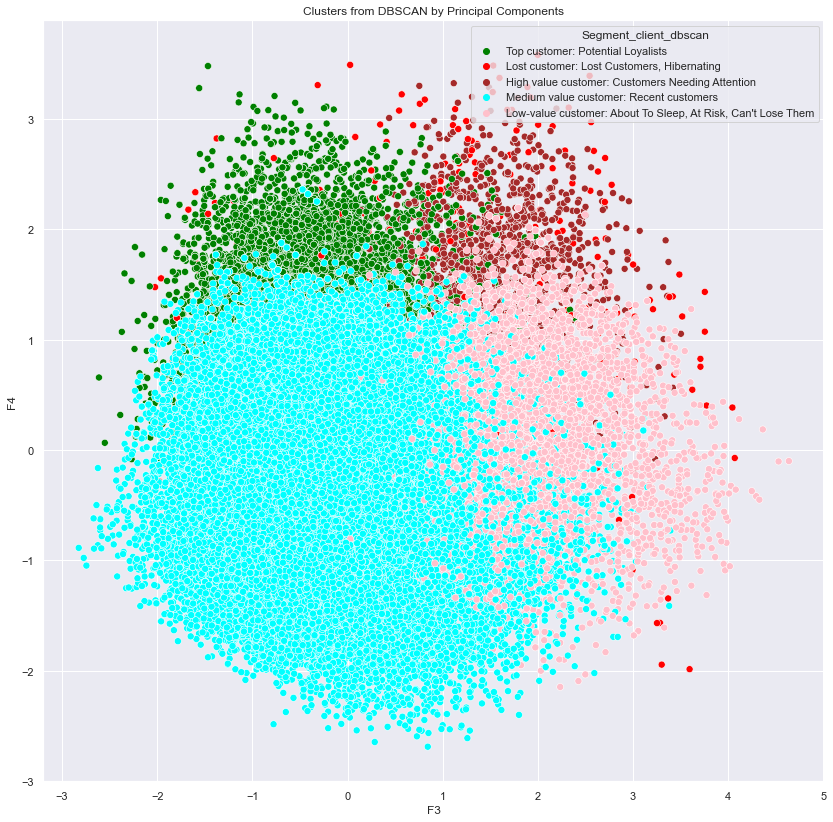

In [255]:
plt.subplots(figsize=(14, 14))
my_pal = {"Lost customer: Lost Customers, Hibernating":"red",
           "Low-value customer: About To Sleep, At Risk, Can\'t Lose Them":"pink",
           "High value customer: Customers Needing Attention":"brown",
           "Medium value customer: Recent customers":"cyan",
           "Top customer: Potential Loyalists":"green"}
sns.scatterplot(x = df_dbscan_reduced_PCA['F3'], y = df_dbscan_reduced_PCA['F4'], hue = df_dbscan_reduced_PCA['Segment_client_dbscan'], palette=my_pal, s = 50)
plt.title('Clusters from DBSCAN by Principal Components')
plt.show()

## Segmentation maintenance analysis

### Creation of a dataframe for segmentation maintenance analysis

Now that we have associated the labels created by K-means to the clients segments, we will try to determine the dynamics of the clients segmentation in time. For this we will merge the dataframe used in K-means analysis that contains the labels asigned to each cluster, with the dataframe created for the analysis of order placement afluence.

In [128]:
df_merge_segmentation_stability_analysis = new_df_k_means_reduced_PCA.copy()

df_merge_segmentation_stability_analysis = df_merge_segmentation_stability_analysis.merge(df_subset_for_purchase_dates, on='customer_unique_id', how='left') 

In [129]:
df_merge_segmentation_stability_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132291 entries, 0 to 132290
Data columns (total 5 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   customer_unique_id        132291 non-null  object        
 1   Segment_k_means_label     132291 non-null  int32         
 2   order_id                  132291 non-null  object        
 3   order_purchase_timestamp  132291 non-null  datetime64[ns]
 4   purchase_month            132291 non-null  object        
dtypes: datetime64[ns](1), int32(1), object(3)
memory usage: 5.6+ MB


In [130]:
df_merge_segmentation_stability_analysis['Segment_client_k_means'] = \
    df_merge_segmentation_stability_analysis['Segment_k_means_label'].map({
        0: 'Top customer: Potential Loyalists', 
        4: 'High value customer: Customers Needing Attention', 
        3: 'Medium value customer: Recent customers', 
        2: 'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them', 
        1: 'Lost customer: Lost Customers, Hibernating' 
        })

In [131]:
df_merge_segmentation_stability_analysis.head(10)

,customer_unique_id,Segment_k_means_label,order_id,order_purchase_timestamp,purchase_month,Segment_client_k_means
0,598ffe324e745b97fd07d03416c49d16,4,3f13c6c8bb6e531e041cc02ecda5880b,2018-06-13,June,High value customer: Customers Needing Attention
1,17e5182d5817ab03fa16ee8e960e1b87,4,321306819534558dae9c3a1a551e91c7,2017-08-28,August,High value customer: Customers Needing Attention
2,acea13a79aeaf715ba68122e9deb330a,4,55a90b35362150673d3546509274be53,2018-08-13,August,High value customer: Customers Needing Attention
3,acea13a79aeaf715ba68122e9deb330a,4,bcbc83ec3dc71750aff96a593b9e280f,2018-06-06,June,High value customer: Customers Needing Attention
4,acea13a79aeaf715ba68122e9deb330a,4,55a90b35362150673d3546509274be53,2018-08-13,August,High value customer: Customers Needing Attention
5,acea13a79aeaf715ba68122e9deb330a,4,bcbc83ec3dc71750aff96a593b9e280f,2018-06-06,June,High value customer: Customers Needing Attention
6,acea13a79aeaf715ba68122e9deb330a,4,55a90b35362150673d3546509274be53,2018-08-13,August,High value customer: Customers Needing Attention
7,acea13a79aeaf715ba68122e9deb330a,4,bcbc83ec3dc71750aff96a593b9e280f,2018-06-06,June,High value customer: Customers Needing Attention
8,acea13a79aeaf715ba68122e9deb330a,4,55a90b35362150673d3546509274be53,2018-08-13,August,High value customer: Customers Needing Attention
9,acea13a79aeaf715ba68122e9deb330a,4,bcbc83ec3dc71750aff96a593b9e280f,2018-06-06,June,High value customer: Customers Needing Attention


Now we will define a period of time equal to one year. We will use the data from September 2017 to September 2018. 

As we will use the data for the period from September 2017 to September 2018, we will see how many clients belong to each customer segment in each year season, this is:

* September, 2017 - November, 2017 --> Fall season
* December, 2017 - February, 2018 --> Winter season
* March, 2018 - May, 2018 --> Spring season
* June, 2018 - August, 2018 --> Summer season

In [132]:
def create_season_dataframe(df_season, season_start_date, season_end_date):

    mask = (df_season['order_purchase_timestamp'] >= season_start_date) & (df_season['order_purchase_timestamp'] <= season_end_date)

    df_season = df_season.loc[mask]

    df_season['order_purchase_timestamp'] = pd.to_datetime(df_season['order_purchase_timestamp']).dt.date

    df_season_stats = pd.DataFrame(df_season.groupby('Segment_client_k_means', as_index= False).agg({'customer_unique_id': np.size}))

    return df_season_stats

### Fall season dataframe

Next, we will see the stats for the customers segments along the season of the year period.

In [133]:
df_fall_season = df_merge_segmentation_stability_analysis.copy()
df_fall_season_stats = create_season_dataframe(df_fall_season, '2017-09-01', '2017-11-01')
df_fall_season_stats.head()

C:\Users\ASUS\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Segment_client_k_means,customer_unique_id
0,High value customer: Customers Needing Attention,1622
1,"Lost customer: Lost Customers, Hibernating",5588
2,"Low-value customer: About To Sleep, At Risk, C...",159
3,Medium value customer: Recent customers,1107
4,Top customer: Potential Loyalists,4944


In [138]:
data_fall = {'Segment_client_k_means': ['Top customer: Potential Loyalists', 
                                        'High value customer: Customers Needing Attention', 
                                        'Medium value customer: Recent customers', 
                                        'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
                                        'Lost customer: Lost Customers, Hibernating'], 
                'customers_number': [4944, 
                                    1622, 
                                    1107, 
                                    159,
                                    5588]}

ordered_df_fall_season_stats = pd.DataFrame.from_dict(data_fall)

ordered_df_fall_season_stats.head()

,Segment_client_k_means,customers_number
0,Top customer: Potential Loyalists,4944
1,High value customer: Customers Needing Attention,1622
2,Medium value customer: Recent customers,1107
3,"Low-value customer: About To Sleep, At Risk, C...",159
4,"Lost customer: Lost Customers, Hibernating",5588


### Winter season dataframe

In [134]:
df_winter_season = df_merge_segmentation_stability_analysis.copy()
df_winter_season_stats = create_season_dataframe(df_winter_season, '2017-12-01', '2018-02-01')
df_winter_season_stats.head()

C:\Users\ASUS\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Segment_client_k_means,customer_unique_id
0,High value customer: Customers Needing Attention,1969
1,"Lost customer: Lost Customers, Hibernating",6671
2,"Low-value customer: About To Sleep, At Risk, C...",273
3,Medium value customer: Recent customers,1628
4,Top customer: Potential Loyalists,6433


In [139]:
data_winter = {'Segment_client_k_means': ['Top customer: Potential Loyalists', 
                                        'High value customer: Customers Needing Attention', 
                                        'Medium value customer: Recent customers', 
                                        'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
                                        'Lost customer: Lost Customers, Hibernating'], 
                'customers_number': [6433, 
                                    1969, 
                                    1628, 
                                    273,
                                    6671]}

ordered_df_winter_season_stats = pd.DataFrame.from_dict(data_winter)

ordered_df_winter_season_stats.head()

,Segment_client_k_means,customers_number
0,Top customer: Potential Loyalists,6433
1,High value customer: Customers Needing Attention,1969
2,Medium value customer: Recent customers,1628
3,"Low-value customer: About To Sleep, At Risk, C...",273
4,"Lost customer: Lost Customers, Hibernating",6671


### Spring season dataframe

In [135]:
df_spring_season = df_merge_segmentation_stability_analysis.copy()
df_spring_season_stats = create_season_dataframe(df_spring_season, '2018-03-01', '2018-05-01')
df_spring_season_stats.head()

C:\Users\ASUS\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Segment_client_k_means,customer_unique_id
0,High value customer: Customers Needing Attention,2322
1,"Lost customer: Lost Customers, Hibernating",6604
2,"Low-value customer: About To Sleep, At Risk, C...",1168
3,Medium value customer: Recent customers,2206
4,Top customer: Potential Loyalists,5947


In [140]:
data_spring = {'Segment_client_k_means': ['Top customer: Potential Loyalists', 
                                        'High value customer: Customers Needing Attention', 
                                        'Medium value customer: Recent customers', 
                                        'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
                                        'Lost customer: Lost Customers, Hibernating'], 
                    'customers_number': [5947, 
                                        2322, 
                                        2206, 
                                        1168,
                                        6604]}

ordered_df_spring_season_stats = pd.DataFrame.from_dict(data_spring)

ordered_df_spring_season_stats.head()

,Segment_client_k_means,customers_number
0,Top customer: Potential Loyalists,5947
1,High value customer: Customers Needing Attention,2322
2,Medium value customer: Recent customers,2206
3,"Low-value customer: About To Sleep, At Risk, C...",1168
4,"Lost customer: Lost Customers, Hibernating",6604


### Summer season dataframe

In [136]:
df_summer_season = df_merge_segmentation_stability_analysis.copy()
df_summer_season_stats = create_season_dataframe(df_spring_season, '2018-06-01', '2018-08-01')
df_summer_season_stats.head()

C:\Users\ASUS\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Segment_client_k_means,customer_unique_id
0,High value customer: Customers Needing Attention,1692
1,"Lost customer: Lost Customers, Hibernating",1141
2,"Low-value customer: About To Sleep, At Risk, C...",10487
3,Medium value customer: Recent customers,1105
4,Top customer: Potential Loyalists,1359


In [141]:
data_summer = {'Segment_client_k_means': ['Top customer: Potential Loyalists', 
                                        'High value customer: Customers Needing Attention', 
                                        'Medium value customer: Recent customers', 
                                        'Low-value customer: About To Sleep, At Risk, Can\'t Lose Them',
                                        'Lost customer: Lost Customers, Hibernating'], 
                'customers_number': [1359, 
                                    1692, 
                                    1105, 
                                    10487,
                                    1141]}

ordered_df_summer_season_stats = pd.DataFrame.from_dict(data_summer)

ordered_df_summer_season_stats.head()

,Segment_client_k_means,customers_number
0,Top customer: Potential Loyalists,1359
1,High value customer: Customers Needing Attention,1692
2,Medium value customer: Recent customers,1105
3,"Low-value customer: About To Sleep, At Risk, C...",10487
4,"Lost customer: Lost Customers, Hibernating",1141


### Clients segmentation evolution in time

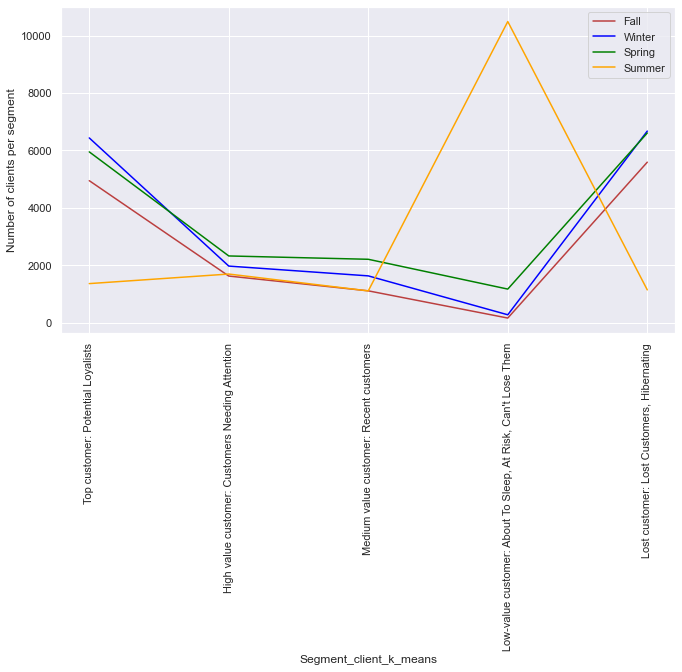

In [143]:
order_ticks = ["Top customer: Potential Loyalists",
                "High value customer: Customers Needing Attention",
                "Medium value customer: Recent customers",
                "Low-value customer: About To Sleep, At Risk, Can\'t Lose Them"
                "Lost customer: Lost Customers, Hibernating"]

sns.lineplot(data=ordered_df_fall_season_stats, x="Segment_client_k_means", y="customers_number", markers='o', color="#bb3f3f", label='Fall')
sns.lineplot(data=ordered_df_winter_season_stats, x="Segment_client_k_means", y="customers_number", markers='x', color="blue", label='Winter')
sns.lineplot(data=ordered_df_spring_season_stats, x="Segment_client_k_means", y="customers_number", markers='+', color="green", label='Spring')
sns.lineplot(data=ordered_df_summer_season_stats, x="Segment_client_k_means", y="customers_number", markers='*', color="orange", label='Summer')

plt.xticks(rotation=90)
plt.ylabel('Number of clients per segment')
plt.legend()

As observed, there is a change in the number of clients belonging to each segment for each season of the year. An interesting observation is that at the begining of the year period (fall, winter and spring), ther are more Top Customers than at the end of the year (summer). Then we see the the loss of good customers and the increase of bad customers as the year passes. The summer starts with a low number of Top Customers and then we see that they fall into Low-value customers.